# Modeling County-Level Jail Incarceration Rates in the U.S.
- **Name:** Serena Quiroga
- **Date of Analysis:** 4 May 2020 - 8 June 2020
- **Date of Presentation:** 10 June, 2020
- **Instructor Name:** Jeff Herman
- **Affiliation:** Flatiron School Data Science Program - Capstone Project
- **Blog post:** https://squiroga8.github.io/classification_of_changes_in_jail_incarceration_rates


## Project Overview

### **Abstract**

**PROBLEM STATEMENT AND METHODOLOGY:**

This project attempts to answer the following question: **Can changes in jail incarceration rates be predicted at the county-level through modeling of structural conditions such as employment rates, education, and population and demographics dynamics?**  Using a subset of incarceration rates data between 2008 and 2017 as compiled by the Vera Institute of Justice from several Bureau of Justice Statistics (BJS) data collections, I appended additional county-level data to model using non-parametric, binary classification algorithms. This data included county-level data on population, demographics, migration, education, income, employment, and veterans. The target variable was constructed by comparing the 2017 jail incarceration rate with the average rate from 2008-2016, with the target labels being Increase or Decrease/Same for the 2017 rate. I followed the OSEMiN framework for this project, sourcing the data from the Vera Institute of Justice and the USDA's Economic Research Service for the other county-level data. After cleaning and exploring the data, I implemented several classification models using GridSearchCV for fine tuning of the hyperparameters for each algorithm. The models used include a baseline Decision Tree Classifier, Random Forest Classifier, Extra Trees Classifier, and AdaBoost Classifier.  Modelling was conducted on two sets of data - one with incarceration-related features and one without.

**FINDINGS AND RECOMMENDATIONS:**

Beginning with the full data, the AdaBoost Classifier achieved the highest performance metric (F1) score of 87% on our test data, which is an 9% increase compared to the Baseline Decision Tree Classifier's F1 score (78%). Across all the models, each algorithm had higher precision and recall when classifying counties with Increased rates, whereas classification of counties with Decreased/Same rates were not nearly as accurate and had lower F1 scores across all models. When it came to modelling the data *without* any incarceration-related features, the AdaBoost was only slightly better performing in terms of having the highest F1 score (75.9%), but the Random Forest model performed better in terms of the F1 scores per class label. The AdaBoost model performed poorly when it came to predicting counties with decreased/steady rates, with a recall score of just 23% and an F1 score of 34% for this class label (0, Same or Decrease). By comparison, the Random Forest Classifier had a 33% recall and a 44% F1 score on this class label. The top features in the RF model are Percentage of Non-Veterans who are on Disability, population change rates, natural change rates (2000-2010, and 2010-2018), median household income, percentage of the population aged 65 or older in 2010, and percentage employment change 2017-2018.

### Overview: Problem Statement & Background

**Problem Statement:** *Can we predict changes in jail incarceration rates at the county level through modeling of structural conditions such as employment rates, education, and population and demographics dynamics?*

**Project Context:** Approximately 0.88% of the total U.S. adult population is currently incarcerated in federal or state prisons or local county jails.  For additional context and scale, 1 out of 5 prisoners in the world is incarcerated in the U.S, meaning that even though the U.S. accounts for less than 5% of the world's population, it holds 20% of the world's incarcerated people. 

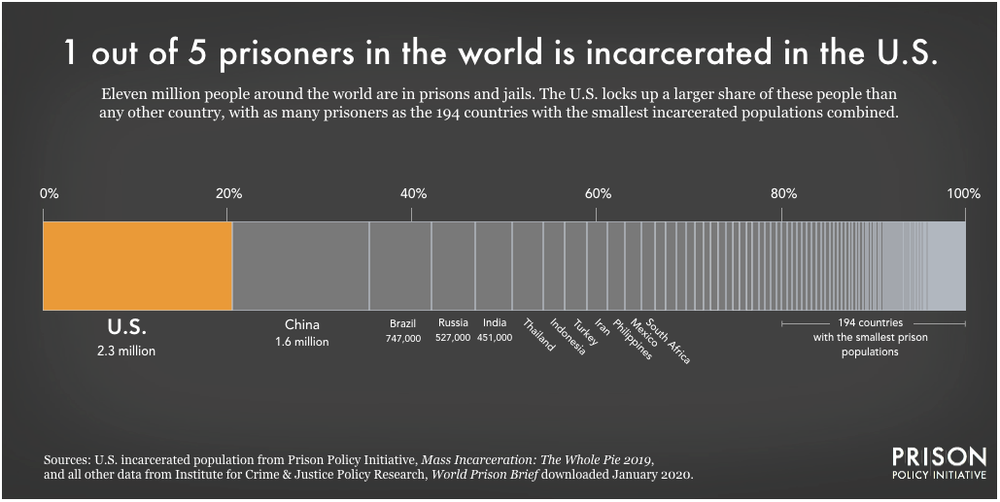

(*source*: https://www.prisonpolicy.org/blog/2020/01/16/percent-incarcerated/)

While research on incarceration tends to focus on state-level data, this county-level analysis allows for a deeper understanding of within-state nuances and hyperlocal differentiation of incarceration dynamics.  This is especially important because state laws on criminal penalties are interpreted and implemented by decision makers at the local city or county level, including local law enforcement, prosecutors, and judges.  Moreover, criminal activities do not happen in a vacuum, and the local ecosystem, including local effects of broader economic and social conditions, could provide additional insight to trends, challenges, and opportunities for improvement to incarceration trends and the criminal justice system.

**Project Relevance:** 
This project could be used by justice system stakeholders and policy makers as a tool for understanding the role that structural conditions such as population dynamics, employment, and education play in incarceration trends at the local county level.  With a focus on the interpretability of this model, it could serve as a reference for identifying potential factors that contribute to increased incarceration rates, especially when and where such anticipated increases might contribute to excessive socio-economic and/or racial disparities. 

**Project Parameters/Limitations:** For this project, I am using a subset of the Vera data focusing on 2008 to 2017.  


### Inputs: Data Sources & Packages Used

**Data Sources:**
The following data, used for this project, are provided in the **Data** folder of this repo.
- **Incarceration Rates Data:**
    - Vera Institute of Justice database of county and jurisdiction level incarceration rates from 1970 to 2017: https://github.com/vera-institute/incarceration_trends
    - The Database is comprised of the following Bureau of Justice Statistics (BJS) data collections: the Census of Jails (COJ), which covers all jails and is conducted every five to eight years since 1970, and the Annual Survey of Jails (ASJ), which covers about one-third of jails-and includes nearly all of the largest jails-that has been conducted in non-census years since 1982, and the BJS National Corrections Reporting Program (NCRP) data collection. Vera merged this data to produce a first-in-kind national dataset that can examine both jail and prison incarceration at the county level.
        - "*Incarceration Trends is supported by Google.org, the John D. and Catherine T. MacArthur Foundation Safety and Justice Challenge, and the Robert W. Wilson Charitable Trust.*" http://trends.vera.org/incarceration-rates?data=pretrial

- **County-level data on Population, Jobs, Education:**
    - The United States Department of Agriculture's (USDA) Economic Research Service (ERS): https://catalog.data.gov/dataset/county-level-data-sets
    - The USDA's Atlas of Rural and Small Town America: 
        - "*Data are grouped by topic and reported in four tabs within the spreadsheet: People, Jobs, Income, Veterans, and County Classifications. Each tab includes the County FIPS Code as the first column. The Variable Name Lookup tab allows users to connect the short name for the indicator used as the header in the spreadsheet with the more descriptive title used in the atlas.*" https://www.ers.usda.gov/data-products/atlas-of-rural-and-small-town-america/download-the-data/


**Packages Used:**
- pandas
- numpy
- matplotlib
- seaborn
- scikit-learn
- scipy

**Models Used:**
- Tree-based, non-parametric models:
    - Decision Tree Classifier
    - Random Forest Classifier
    - Extra Trees Classifier
    - AdaBoost Classifier

### OSEMiN Approach & Summary

For this project, I am use the **OSEMiN** approach - Obtain Scrub Explore Model iNterpret.

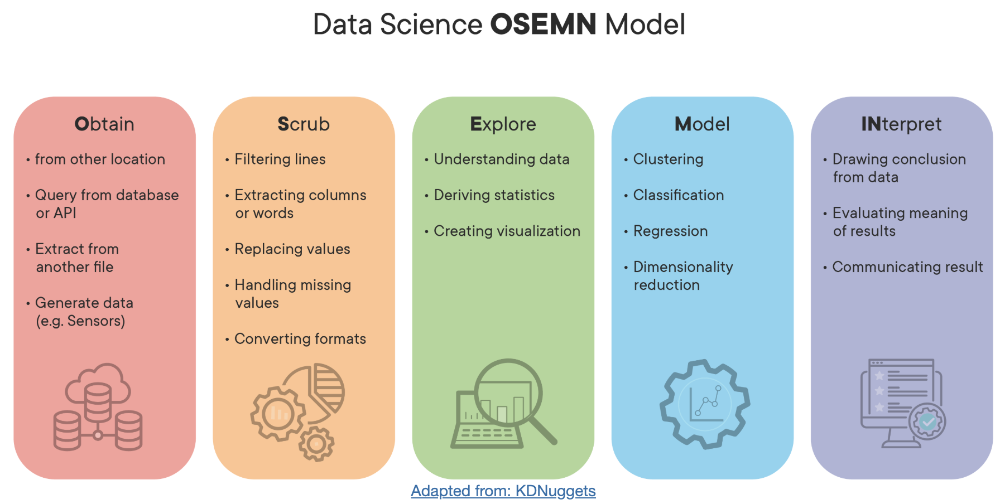

#### Summary of OSEMiN Steps Taken

**Obtain:**
* Obtain csv of data of interest from Vera and ERS.
* Load in the incarceration trends data and individual county-level datasets on socio-economic features (people, jobs, income, and veterans). 

**Scrub:**
* Incarceration data: Subset for years of interest (2008-2017)
    * Removed Prison Data, keeping only jail data
    * Deal with null values by first replacing nulls with county-level means (average over the 10 years of data), then state-level means
    * Transform the dataframe so that each year (originally provided per row) into columns
* County-level data (income, people, veterans, jobs):
    * Examine vars contained in variable look up table
    * Check datatypes
    * Deal with Null values (replacing nulls with state averages)
* Drop redundant variables
* Merge all dataframes on FIPS
* Final Null value check

**Explore:**
* Create target variable using rule: compare 2017 rate with average rate over previous 9 years of data
* Set aside test set
* Create version of cleaned data without incarceration-related features (for modeling)
* Explore and visualize data from copy of full training data.
* Convert categorical data to dummy variables (in training and test data).

**Model:**
* Detail modelling approach, performance metrics, and feature importance.
* Per each version of the data (with and without incarceration-related features):
    * Build Baseline Decision Tree Classifier, Random Forest Classifier, Extra Trees Classifier, and AdaBoost Classifier.
    * Produce evaluation/model performance metrics for each.

**Interpret:**
* Reproduce performance metrics for all models and interpret results.
* Extract key findings and considerations for future analysis.


# **Analysis**

## Libraries to Import

In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# set style, size, palette for all plots
sns.set_style("whitegrid") 
sns.set(rc={'figure.figsize':(14,10)})
sns.set_palette('Set2')
plt.rcParams["axes.labelsize"] = 14

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.tree import export_graphviz
from pydotplus import graph_from_dot_data
from IPython.display import Image

## Functions

In [2]:
# Function to visualize feature importance of classificaiton models
def plot_feature_importances(model):
    '''
    Function to plot the most important features as a horizontal bar chart
    
    Args
        model (sklearn object): fitted sklearn model
    
    Returns 
        horizontal bar chart of the most important features
    '''
    n_features = X2_train.shape[1]
    plt.style.use('seaborn-whitegrid')
    plt.figure(figsize=(10,50))
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X2_train.columns.values)
    plt.title("Feature Importance", fontsize=18)
    plt.ylabel("Feature")
    plt.tight_layout();
    

In [3]:
# Function to visualize multicollinearity using seaborn heatmap
def corr_visual(dataframe):
    '''
    This is a function to visualize correlations in a dataframe using
    seaborn's heatmap. This function will not drop any features, but it will
    identify features to consider dropping based on threshold set.
    '''
    sns.set(style="white") # set style to white for effective masking
    corr = dataframe.corr() # create corr matrix
    mask = np.zeros_like(corr, dtype=np.bool) # generates a mask the size of corr matrix
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11,9)) # initialize matplotlib figure
    cmap = sns.diverging_palette(220, 10, as_cmap=True) # generates custom fiverging colormap
    
    # draw the heatmap with the mask and correct aspect ratio
    return sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.3, 
           center=0, square=True, linewidths=0.5, cbar_kws={'shrink': .5})

In [4]:
def corr_identifier(dataframe, threshold):
    '''
    Produces a list of the variables in a dataframe with high positive or negative 
    correlation with other variables, above a specified threshold
    '''
    # Create correlation matrix, with abs to detect high negative and positive correlations
    corr_matrix = dataframe.corr().abs()
    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
    # Identify index of feature columns with correlations greater than threshold
    to_drop = [col for col in upper.columns if any(upper[col]>=threshold)]
    # Examine features to drop
    return to_drop

## **Obtain**

**Planned Tasks:** I will start by pulling in the data contained in the **Data** folder of this repo, beginning with the Vera incarceration trends data and then the County-Level datasets.

### Incarceration Data:

In [6]:
# Set path for incarceration data
incarc_path = 'Data/Vera_incarceration_trends/incarceration_trends.csv'

# Load incarceration data into pandas
incarc_df = pd.read_csv(incarc_path)
incarc_df.shape

(150672, 121)

### County-Level Data:

In [7]:
!ls Data/Rural_Atlas_Update21/ 

County Classifications.csv RuralAtlasData21.xlsx
Income.csv                 Variable Name Lookup.csv
Jobs.csv                   Veterans.csv
People.csv                 ~$RuralAtlasData21.xlsx


In [8]:
# Set file paths to each csv
income_path = 'Data/Rural_Atlas_Update21/Income.csv'
jobs_path = 'Data/Rural_Atlas_Update21/Jobs.csv'
people_path = 'Data/Rural_Atlas_Update21/People.csv'
var_lookup_path = 'Data/Rural_Atlas_Update21/Variable Name Lookup.csv'
veter_path = 'Data/Rural_Atlas_Update21/Veterans.csv'

# Load into pandas dataframes
income_df = pd.read_csv(income_path)
jobs_df = pd.read_csv(jobs_path)
people_df = pd.read_csv(people_path)
var_lookup_df = pd.read_csv(var_lookup_path)
veter_df = pd.read_csv(veter_path)

# Print out shapes of dataframes
county_dfs = [income_df, jobs_df, people_df, var_lookup_df, veter_df]
for df in county_dfs:
    print(df.shape)

(3278, 11)
(3278, 66)
(3273, 90)
(232, 5)
(3278, 35)


As we can see in the above, four out of the five county dataframes have approximately the same number of observations (~3270 rows), except for the `var_lookup_df` which only has 232 rows. We will take a quick look at this dataset to decide if we should continue with it into the next stage.

In [9]:
var_lookup_df.head()

,Cat_Sort,Category,varShort,varLong,Map
0,1,People,HH65PlusAlonePct,"Percent of persons 65 or older living alone, 2...",y
1,1,People,NaturalChangeRate0010,"Natural population change rate, 2000-10",y
2,1,People,NetMigrationRate1018,"Net migration rate, 2010-18",y
3,1,People,Under18Pct2010,"Percent of population under age 18, 2010",y
4,1,People,Ed4AssocDegreePct,"Percent of persons with an associate's degree,...",y


Upon further review of this dataset (above) we can see that this database serves more as a codebook for understanding the variables in the county dataframes.  We will keep as a reference, but it won't be relevant or used directly for analysis and modeling.

**Summary of *OBTAIN* Step:** We loaded in the incarceration trends data and individual county-level datasets on socio-economic features (people, jobs, income, and veterans).  We identified one county-level dataset that will serve as a codebook for understanding the variables included in the other four county-level dataframes. We will now proceed with the Scrub step.

## **Scrub**

**Planned tasks:**

1. Take quick look at each df.
    - Take temporal subset of incarceration data.
    - Transform incarceration df into wide format so that each county is one row.
    - Check Datatypes.
    - Remove unnecessary columns.
        - *Note since we we will be using tree-based models in the end, we do not need to worry about multicollinearity or high correlations in our features.*
2. Merge dfs.
3. Deal with Null values.
4. Remove irrelevant data.

### Incarceration Data - Subset and Initial Look

In [10]:
# preview the dataframe, with info
incarc_df.info()
incarc_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150672 entries, 0 to 150671
Columns: 121 entries, yfips to white_prison_adm_rate
dtypes: float64(109), int64(7), object(5)
memory usage: 139.1+ MB


,yfips,year,fips,state,county_name,total_pop,total_pop_15to64,female_pop_15to64,male_pop_15to64,aapi_pop_15to64,...,native_prison_pop_rate,white_prison_pop_rate,total_prison_adm_rate,female_prison_adm_rate,male_prison_adm_rate,aapi_prison_adm_rate,black_prison_adm_rate,latinx_prison_adm_rate,native_prison_adm_rate,white_prison_adm_rate
0,197001001,1970,1001,AL,Autauga County,24661,14154,7293,6861,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,197101001,1971,1001,AL,Autauga County,25503,14765,7585,7180,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,197201001,1972,1001,AL,Autauga County,27156,15939,8168,7771,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,197301001,1973,1001,AL,Autauga County,28453,16906,8651,8255,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,197401001,1974,1001,AL,Autauga County,29261,17578,8992,8586,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We have 121 columns, which we can't fully represent here, and 150,672 rows in the full incarceration trends dataset. We already know from the outset that we are only interested in a temporal subset of this data - years 2008 through 2018. Let's go ahead and extract our data of interest.

#### Subset 2008 onwards

In [11]:
# Check type of year column and if there are any null values in the year column
incarc_df.year.dtype
incarc_df.year.isnull().sum()

dtype('int64')

0

In [12]:
# Drop any data from before 2008
incarc_df.drop(incarc_df[incarc_df['year'] < 2008].index, inplace=True)
incarc_df.info()
incarc_df.year.value_counts()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31390 entries, 38 to 150671
Columns: 121 entries, yfips to white_prison_adm_rate
dtypes: float64(109), int64(7), object(5)
memory usage: 29.2+ MB


2015    3139
2014    3139
2013    3139
2012    3139
2011    3139
2010    3139
2009    3139
2008    3139
2017    3139
2016    3139
Name: year, dtype: int64

From the above we can see that we have retained data for years 2008 to 2017, leaving us with 31,390 rows in our incarceration trends dataframe.

#### Remove Prison Data, Keeping Jail Data Only

Since we are focusing on jail incarceration rates at the county level, we will remove prison data (populations, admission numbers, and rates) because not all counties have prisons and because we want to focus on the local conditions and factors that relate to local incarceration dynamics.

In [13]:
# Make a list of all columns that contain "prison" in the name
prison_cols = [col for col in incarc_df.columns if 'prison' in col]
prison_cols

['total_jail_from_prison',
 'total_prison_pop',
 'female_prison_pop',
 'male_prison_pop',
 'aapi_prison_pop',
 'black_prison_pop',
 'latinx_prison_pop',
 'native_prison_pop',
 'other_race_prison_pop',
 'white_prison_pop',
 'aapi_female_prison_pop',
 'aapi_male_prison_pop',
 'black_female_prison_pop',
 'black_male_prison_pop',
 'latinx_female_prison_pop',
 'latinx_male_prison_pop',
 'native_female_prison_pop',
 'native_male_prison_pop',
 'other_race_female_prison_pop',
 'other_race_male_prison_pop',
 'white_female_prison_pop',
 'white_male_prison_pop',
 'total_prison_adm',
 'female_prison_adm',
 'male_prison_adm',
 'aapi_prison_adm',
 'black_prison_adm',
 'latinx_prison_adm',
 'native_prison_adm',
 'other_race_prison_adm',
 'white_prison_adm',
 'aapi_female_prison_adm',
 'aapi_male_prison_adm',
 'black_female_prison_adm',
 'black_male_prison_adm',
 'latinx_female_prison_adm',
 'latinx_male_prison_adm',
 'native_female_prison_adm',
 'native_male_prison_adm',
 'other_race_female_prison_ad

Looking through the list above, we will keep the column `total_jail_from_prison` in our dataframe.

In [14]:
# Create list of prison cols to drop but we will keep any variables that mention 'jail'
prison_cols_todrop = [col for col in prison_cols if 'jail' not in col]

In [15]:
# Drop prison_cols_todrop from our dataframe
incarc_df.drop(prison_cols_todrop, axis=1, inplace=True)
incarc_df.shape

(31390, 63)

#### Null Values + Feature Selection (Round 1)

Before we transform the shape of our data so that each var per year is its own column, let's see if there are any columns we should drop or deal with first.

In [16]:
# Create series of percentage missing values per column
missing = incarc_df.isnull().sum()/len(incarc_df)
missing.sort_values(ascending=False).head(35)

female_jail_pop_dcrp          0.460338
female_jail_adm_dcrp          0.456356
male_jail_adm_dcrp            0.453297
total_jail_adm_dcrp           0.453106
total_jail_pop_dcrp           0.452501
male_jail_pop_dcrp            0.452501
metro_area                    0.425613
total_jail_adm_rate           0.065849
total_jail_adm                0.065849
total_jail_dis                0.065849
female_juvenile_jail_pop      0.065849
male_juvenile_jail_pop        0.065849
female_jail_pop               0.065626
male_adult_jail_pop           0.065626
male_jail_pop_rate            0.065626
male_jail_pop                 0.065626
female_adult_jail_pop         0.065626
female_jail_pop_rate          0.065626
aapi_jail_pop_rate            0.062472
black_jail_pop_rate           0.060529
native_jail_pop_rate          0.060433
total_jail_from_other_jail    0.060051
other_race_jail_pop           0.060051
total_jail_from_prison        0.060051
total_jail_from_bop           0.059255
native_jail_pop          

Above, we can see that many of these columns with missing values have approximately the same amount of missing values and also have similar sounding names between them. For instance, we have `female_jail_pop_dcrp` and `female_jail_pop` and `female_adult_jail_pop` and `female_juvenile_jail_pop`. In looking at the codebook for the Vera dataset, it states that:

*Jail population data is computed using the ASJ and COJ (jail variables with no suffix) and the DCRP (jail variables with the suffix “DCRP”. The ASJ/COJ data is available for the period 1970-2017; DCRP data is only available for the period 2000-2013. Note that during the period 2000-2013 data is sometimes missing in the DCRP variables but available in the ASJ/COJ variables.*

We will start by dealing with dcrp data versus the non-suffixed vars of the same features, ideally dropping the dcrp features since they are almost half missing, unless we can use that data to replace missing data in the non-suffixed columns (ASJ/COJ).

In [17]:
# Fill null values in un-suffixed (asj/coj) columns with non-null values from dcrp columns
incarc_df['total_jail_pop'].fillna(incarc_df['total_jail_pop_dcrp'], inplace=True)
incarc_df['female_jail_pop'].fillna(incarc_df['female_jail_pop_dcrp'], inplace=True)
incarc_df['male_jail_pop'].fillna(incarc_df['male_jail_pop_dcrp'], inplace=True)
incarc_df['total_jail_adm'].fillna(incarc_df['total_jail_adm_dcrp'], inplace=True)
incarc_df['female_jail_pop'].fillna(incarc_df['female_jail_pop_dcrp'], inplace=True)
incarc_df['male_jail_pop'].fillna(incarc_df['male_jail_pop_dcrp'], inplace=True)

# List of dcrp cols
dcrp_cols = list(incarc_df.filter(regex="dcrp").columns)

# Drop dcrp columns from df
incarc_df.drop(dcrp_cols, axis=1, inplace=True)

Now we will take a look at `metro_area` as this var had nearly 43% null values. According to the Vera dataset codebook (contained in the Data folder of this repo):

*Vera’s measure of urbanicity collapses the six categories defined by the National Center for Health Statistics (NCHS) Urban-Rural Classification Scheme for Counties to four, by combining medium with small metropolitan areas, and micropolitan (an urban area with a population of at least 10,000 but less than 50,000) with non-core areas (all other areas not considered metropolitan or micropolitan). Vera counts the former as “Small and Mid Metros” and the latter as “Rural.” A county is labeled “Large Metro, Urban” if it is one of the core counties of a metropolitan area with a million or more people, and a county is labeled “Large Metro, Suburban” if it is within that surrounding metropolitan area. Rural areas are the most numerous category, with more than 1,900 counties.*

Based on this, we will rely on the `urbanicity` column in our dataset, and remove this `metro_area` column as it does not apply to over half of our counties and turning it into a binary var (metro or not) is already captured by the `urbanicity` feature.

In [18]:
# Drop metro_area from df
incarc_df.drop('metro_area', axis=1, inplace=True)

In [19]:
# Quick look at remaining null values as pct of their column
(incarc_df.isnull().sum()/len(incarc_df)).sort_values(ascending=False)

male_juvenile_jail_pop        0.065849
total_jail_dis                0.065849
female_juvenile_jail_pop      0.065849
total_jail_adm_rate           0.065849
male_adult_jail_pop           0.065626
female_adult_jail_pop         0.065626
male_jail_pop_rate            0.065626
female_jail_pop_rate          0.065626
female_jail_pop               0.064256
total_jail_adm                0.063715
male_jail_pop                 0.063683
aapi_jail_pop_rate            0.062472
black_jail_pop_rate           0.060529
native_jail_pop_rate          0.060433
total_jail_from_prison        0.060051
other_race_jail_pop           0.060051
total_jail_from_other_jail    0.060051
total_jail_from_bop           0.059255
latinx_jail_pop               0.058458
native_jail_pop               0.058458
white_jail_pop                0.058458
aapi_jail_pop                 0.058458
black_jail_pop                0.058458
total_jail_from_bia           0.058458
total_jail_from_marshals      0.058458
latinx_jail_pop_rate     

In [20]:
# Check two variables if binary
incarc_df.regional_jail_flag.value_counts()
incarc_df.private_jail_flag.value_counts()

0.0    26064
1.0     4586
Name: regional_jail_flag, dtype: int64

0.0    30401
1.0      249
Name: private_jail_flag, dtype: int64

Given that the overwhelming majority of these values in these two columns are "0", we will replace the null values with "0".

In [21]:
# Fill null values with 0
incarc_df.regional_jail_flag.fillna(0, inplace=True)
incarc_df.private_jail_flag.fillna(0, inplace=True)

In [22]:
incarc_df.private_jail_flag.value_counts()

0.0    31141
1.0      249
Name: private_jail_flag, dtype: int64

In [23]:
# Change datatype of private jail and regional jail flag vars
incarc_df['regional_jail_flag'] = incarc_df['regional_jail_flag'].astype('category')
incarc_df['private_jail_flag'] = incarc_df['private_jail_flag'].astype('category')

In [24]:
# Print column names of columns with missing values
incarc_df.columns[incarc_df.isnull().any()]

Index(['commuting_zone', 'land_area', 'total_jail_pop', 'female_jail_pop',
       'male_jail_pop', 'female_adult_jail_pop', 'female_juvenile_jail_pop',
       'male_adult_jail_pop', 'male_juvenile_jail_pop', 'aapi_jail_pop',
       'black_jail_pop', 'latinx_jail_pop', 'native_jail_pop',
       'white_jail_pop', 'other_race_jail_pop', 'total_jail_pretrial',
       'total_jail_from_prison', 'total_jail_from_other_jail',
       'total_jail_from_fed', 'total_jail_from_bia', 'total_jail_from_bop',
       'total_jail_from_ice', 'total_jail_from_marshals',
       'total_jail_from_other_fed', 'jail_rated_capacity', 'total_jail_adm',
       'total_jail_dis', 'total_jail_pop_rate', 'female_jail_pop_rate',
       'male_jail_pop_rate', 'aapi_jail_pop_rate', 'black_jail_pop_rate',
       'latinx_jail_pop_rate', 'native_jail_pop_rate', 'white_jail_pop_rate',
       'total_jail_adm_rate', 'total_jail_pretrial_rate'],
      dtype='object')

Most features still have some null values, between 2-6% in each column, and since we are dealing with all numerical data with data across multiple years for the each county, we will use `fillna` to replace the null values based on the best method after doing some exploration of county-level and state-level aggregates.

In [25]:
# Check if grouping by unique county will eliminate nulls
(incarc_df.groupby(['fips']).mean().isnull().sum()/len(incarc_df)).sort_values(ascending=False)

total_jail_dis                0.006563
female_adult_jail_pop         0.006563
male_jail_pop_rate            0.006563
female_jail_pop_rate          0.006563
female_juvenile_jail_pop      0.006563
male_adult_jail_pop           0.006563
male_juvenile_jail_pop        0.006563
total_jail_adm_rate           0.006563
female_jail_pop               0.006308
male_jail_pop                 0.006212
total_jail_adm                0.006180
native_jail_pop_rate          0.005671
aapi_jail_pop_rate            0.005671
total_jail_pop_rate           0.005639
latinx_jail_pop               0.005607
white_jail_pop                0.005607
total_jail_pretrial_rate      0.005607
black_jail_pop                0.005607
aapi_jail_pop                 0.005607
total_jail_pretrial           0.005607
other_race_jail_pop           0.005607
native_jail_pop               0.005607
total_jail_from_prison        0.005607
total_jail_from_fed           0.005607
total_jail_from_bia           0.005607
total_jail_from_bop      

In [26]:
state_grouped = incarc_df.groupby(['state']).mean().copy()
state_grouped[state_grouped.total_jail_pop_rate.isnull()]

,yfips,year,fips,total_pop,total_pop_15to64,female_pop_15to64,male_pop_15to64,aapi_pop_15to64,black_pop_15to64,latinx_pop_15to64,...,total_jail_pop_rate,female_jail_pop_rate,male_jail_pop_rate,aapi_jail_pop_rate,black_jail_pop_rate,latinx_jail_pop_rate,native_jail_pop_rate,white_jail_pop_rate,total_jail_adm_rate,total_jail_pretrial_rate
state,,,,,,,,,,,,,,,,,,,,,
CT,201259008.0,2012.5,9008.0,447483.625000,299662.037500,151427.062500,148234.975,14061.562500,31759.987500,43546.15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DE,201260003.0,2012.5,10003.0,306721.466667,201811.266667,103388.866667,98422.400,8139.666667,45695.033333,16830.30,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RI,201294005.0,2012.5,44005.0,211031.700000,143310.080000,72781.660000,70528.420,5394.220000,9140.440000,19231.16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VT,201300014.0,2012.5,50014.0,44662.042857,30275.192857,15191.242857,15083.950,531.800000,401.678571,520.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


From the above, we can see that there are 4 states without data on jail pop rates - CT, DE, RI, VT.  We know that after our approach, we will still be left with some missing values.

After exploring the presence of null values at the county and state level, here is how we will proceed:
- replace null values with county-level averages
- replace remaining null values with state-level averages
- depending on the number of remaining null values, drop observations with null values, starting with `total_jail_pop_rate` since this is our target variable

In [27]:
# Replace null values with county-level averages
print("Total null values before county-level fillna: {}".format(incarc_df.isnull().sum().sum()))
incarc_df = incarc_df.fillna(incarc_df.groupby(["fips"]).transform(lambda x: x.fillna(x.mean())))
print("Total null values remaining after county-level fillna: {}".format(incarc_df.isnull().sum().sum()))

# Replace null values with state-level averages
incarc_df = incarc_df.fillna(incarc_df.groupby(["state"]).transform(lambda x: x.fillna(x.mean())))
print("Total null values remaining after state-level fillna: {}".format(incarc_df.isnull().sum().sum()))

# Count number of null values in target variable
print("# of null values in target var (total_jail_pop_rate): {}".format(incarc_df.total_jail_pop_rate.isnull().sum()))

# Number of counties with null values in
print("# of counties with missing data in target variable and years missing:")
incarc_df.loc[incarc_df.total_jail_pop_rate.isnull()]['fips'].nunique()
incarc_df.loc[incarc_df.total_jail_pop_rate.isnull()]['year'].unique()

Total null values before county-level fillna: 66733
Total null values remaining after county-level fillna: 64630
Total null values remaining after state-level fillna: 10500
# of null values in target var (total_jail_pop_rate): 300
# of counties with missing data in target variable and years missing:


30

array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017])

In [28]:
# print first 10 rows of dataframe where target variable is null
incarc_df.loc[incarc_df.total_jail_pop_rate.isnull()].head(10)

,yfips,year,fips,state,county_name,total_pop,total_pop_15to64,female_pop_15to64,male_pop_15to64,aapi_pop_15to64,...,total_jail_pop_rate,female_jail_pop_rate,male_jail_pop_rate,aapi_jail_pop_rate,black_jail_pop_rate,latinx_jail_pop_rate,native_jail_pop_rate,white_jail_pop_rate,total_jail_adm_rate,total_jail_pretrial_rate
14870,200809001,2008,9001,CT,Fairfield County,903824,596518,303350,293168,29997.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14871,200909001,2009,9001,CT,Fairfield County,910421,601757,305838,295919,30837.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14872,201009001,2010,9001,CT,Fairfield County,919330,608506,309460,299046,31983.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14873,201109001,2011,9001,CT,Fairfield County,927897,615269,312657,302612,33291.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14874,201209001,2012,9001,CT,Fairfield County,935097,618854,314155,304699,34493.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14875,201309001,2013,9001,CT,Fairfield County,939991,622493,315958,306535,35215.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14876,201409001,2014,9001,CT,Fairfield County,944355,625691,317170,308521,36566.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14877,201509001,2015,9001,CT,Fairfield County,945301,626288,317493,308795,37467.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14878,201609001,2016,9001,CT,Fairfield County,944802,625601,316978,308623,38217.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14879,201709001,2017,9001,CT,Fairfield County,943457,622991,315436,307555,38531.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
# Keep dataframe where target variable is NOT null
incarc_df = incarc_df[incarc_df['total_jail_pop_rate'].notna()]
incarc_df.shape
print("Total null values remaining: {}".format(incarc_df.isnull().sum().sum()))


(31090, 56)

Total null values remaining: 0


Now that we have addressed all null values and finalized some initial feature selection, let's move onto the next step of pre-processing the incarceration data...

#### Transform shape of Incarceration df - each county on one row

Ultimately, we want to build a database where each unique county has one row with all incarceration and county level data across the columns. Essentially, we should end with a database of roughly 3139 rows. This means we will need to reshape the incarceration df so that each year and its data are represented as columns.

Eventually we will also want to drop `yfips` as this variable will no longer be relevant once we have the years and their data transposed as columns.

In [30]:
incarc_df.columns[:20]

Index(['yfips', 'year', 'fips', 'state', 'county_name', 'total_pop',
       'total_pop_15to64', 'female_pop_15to64', 'male_pop_15to64',
       'aapi_pop_15to64', 'black_pop_15to64', 'latinx_pop_15to64',
       'native_pop_15to64', 'white_pop_15to64', 'urbanicity', 'region',
       'division', 'commuting_zone', 'land_area', 'total_jail_pop'],
      dtype='object')

Now we will set aside the start of our (unique) county-level dataframe, containing the columns that do not vary by year and therefore do not need to be part of the transformation.

In [31]:
# Extract df with columns that don't vary by year into new df
df = incarc_df[['fips', 'state', 'county_name', 'urbanicity', 'region', 
             'division', 'commuting_zone', 'land_area', 'private_jail_flag', 'regional_jail_flag']].copy()

# Print the original shape to compare with de-duplicated shape
df.shape

# Drop duplicates to keep one unique county per row
df.drop_duplicates(subset="fips", keep="first", inplace=True)
df.shape
df.head()

(31090, 10)

(3109, 10)

,fips,state,county_name,urbanicity,region,division,commuting_zone,land_area,private_jail_flag,regional_jail_flag
38,1001,AL,Autauga County,small/mid,South,East South Central,60.0,594.45,0.0,0.0
86,1003,AL,Baldwin County,small/mid,South,East South Central,254.0,1589.82,0.0,0.0
134,1005,AL,Barbour County,rural,South,East South Central,20.0,885.00,0.0,0.0
182,1007,AL,Bibb County,suburban,South,East South Central,21.0,622.46,0.0,0.0
230,1009,AL,Blount County,suburban,South,East South Central,21.0,644.82,0.0,0.0


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3109 entries, 38 to 150662
Data columns (total 10 columns):
fips                  3109 non-null int64
state                 3109 non-null object
county_name           3109 non-null object
urbanicity            3109 non-null object
region                3109 non-null object
division              3109 non-null object
commuting_zone        3109 non-null float64
land_area             3109 non-null float64
private_jail_flag     3109 non-null category
regional_jail_flag    3109 non-null category
dtypes: category(2), float64(2), int64(1), object(5)
memory usage: 224.9+ KB


Now we will transform the main `incarc_df` to put it in the appropriate county-level shape, which means transferring each year's data into new columns.

In [33]:
# Drop cols from incarc df that do not vary by year, except for fips (will use to merge)
incarc_to_pivot = incarc_df.drop(['yfips', 'state', 'county_name', 'urbanicity', 'region', 
             'division', 'commuting_zone', 'land_area', 'private_jail_flag', 'regional_jail_flag'], axis=1).copy()

# Make a list of the column names to be used in the pivot method
cols = incarc_to_pivot.columns[2:]

In [34]:
# Use pivot to transform the data so that each county's data across the 10 years is on one row
incarc_piv_df = incarc_to_pivot.pivot(index='fips', columns='year', values=cols)
incarc_piv_df.head()

total_pop                                                              \
year      2008      2009      2010      2011      2012      2013      2014   
fips                                                                         
1001   53277.0   54135.0   54754.0   55208.0   54936.0   54713.0   54876.0   
1003  175827.0  179406.0  183111.0  186540.0  190143.0  194886.0  199189.0   
1005   27808.0   27657.0   27330.0   27350.0   27174.0   26944.0   26758.0   
1007   22705.0   22941.0   22872.0   22747.0   22664.0   22516.0   22541.0   
1009   57055.0   57341.0   57373.0   57554.0   57570.0   57611.0   57521.0   

                                    ... total_jail_pretrial_rate          \
year      2015      2016      2017  ...                     2008    2009   
fips                                ...                                    
1001   54838.0   55242.0   55443.0  ...                   352.13  331.64   
1003  202995.0  207712.0  212619.0  ...                   477.33  471.00   
1005   26294.0   25819.0   25158.0  ...                   169.52  180.66   
1007   22562.0   22576.0   22555.0  ...                   392.09  377.16   
1009   57522.0   57517.0   57827.0  ...                   235.38  224.60   

                                                                      
year    2010    2011    2012    2013    2014    2015    2016    2017  
fips                                                                  
1001  312.47  295.30  283.22  268.50  267.82  268.68  266.53  266.84  
1003  464.07  458.78  454.74  447.50  389.57  334.28   73.17  368.75  
1005  194.44  206.28  220.53  235.45  239.40  245.90  252.66  261.10  
1007  369.04  362.39  356.74  351.49  322.81  293.50  360.82  423.34  
1009  214.99  204.99  196.33  187.35  188.46  189.23  189.84  189.37  

[5 rows x 440 columns]

Since we will want to flatten the multi-index columns, let's first examine them more closely before replacing with new column names.

In [35]:
# Take a look at the multi-index columns
multi_ind_cols = incarc_piv_df.columns
type(multi_ind_cols)
type(multi_ind_cols.levels[0])
type(multi_ind_cols.levels[1])
multi_ind_cols

pandas.core.indexes.multi.MultiIndex

pandas.core.indexes.base.Index

pandas.core.indexes.numeric.Int64Index

MultiIndex([(               'total_pop', 2008),
            (               'total_pop', 2009),
            (               'total_pop', 2010),
            (               'total_pop', 2011),
            (               'total_pop', 2012),
            (               'total_pop', 2013),
            (               'total_pop', 2014),
            (               'total_pop', 2015),
            (               'total_pop', 2016),
            (               'total_pop', 2017),
            ...
            ('total_jail_pretrial_rate', 2008),
            ('total_jail_pretrial_rate', 2009),
            ('total_jail_pretrial_rate', 2010),
            ('total_jail_pretrial_rate', 2011),
            ('total_jail_pretrial_rate', 2012),
            ('total_jail_pretrial_rate', 2013),
            ('total_jail_pretrial_rate', 2014),
            ('total_jail_pretrial_rate', 2015),
            ('total_jail_pretrial_rate', 2016),
            ('total_jail_pretrial_rate', 2017)],
           names=[None,

We can see that the second level of the column index are numerical. We will want to change these to string type so that we can combine them with the first level index values to create unique column names.

In [36]:
# Make a flattened list of the multi-index column names, will be a list of tuples
col_names = incarc_piv_df.columns.to_flat_index().to_list()

# Change data type to string
col_names = [tuple(map(str, sub)) for sub in col_names]

# Join the values in each tuple to create the new column names
col_names = list(map("_".join, col_names))

# Replace the column names in the datafame
incarc_piv_df.columns = col_names

incarc_piv_df.head(2)

,total_pop_2008,total_pop_2009,total_pop_2010,total_pop_2011,total_pop_2012,total_pop_2013,total_pop_2014,total_pop_2015,total_pop_2016,total_pop_2017,...,total_jail_pretrial_rate_2008,total_jail_pretrial_rate_2009,total_jail_pretrial_rate_2010,total_jail_pretrial_rate_2011,total_jail_pretrial_rate_2012,total_jail_pretrial_rate_2013,total_jail_pretrial_rate_2014,total_jail_pretrial_rate_2015,total_jail_pretrial_rate_2016,total_jail_pretrial_rate_2017
fips,,,,,,,,,,,,,,,,,,,,,
1001,53277.0,54135.0,54754.0,55208.0,54936.0,54713.0,54876.0,54838.0,55242.0,55443.0,...,352.13,331.64,312.47,295.30,283.22,268.5,267.82,268.68,266.53,266.84
1003,175827.0,179406.0,183111.0,186540.0,190143.0,194886.0,199189.0,202995.0,207712.0,212619.0,...,477.33,471.00,464.07,458.78,454.74,447.5,389.57,334.28,73.17,368.75


Now let's reset the index and have `fips` as a column so that we can use this to merge with our county dataframe.

In [37]:
incarc_piv_df.reset_index(inplace=True)
incarc_piv_df.head(2)

,fips,total_pop_2008,total_pop_2009,total_pop_2010,total_pop_2011,total_pop_2012,total_pop_2013,total_pop_2014,total_pop_2015,total_pop_2016,...,total_jail_pretrial_rate_2008,total_jail_pretrial_rate_2009,total_jail_pretrial_rate_2010,total_jail_pretrial_rate_2011,total_jail_pretrial_rate_2012,total_jail_pretrial_rate_2013,total_jail_pretrial_rate_2014,total_jail_pretrial_rate_2015,total_jail_pretrial_rate_2016,total_jail_pretrial_rate_2017
0,1001,53277.0,54135.0,54754.0,55208.0,54936.0,54713.0,54876.0,54838.0,55242.0,...,352.13,331.64,312.47,295.30,283.22,268.5,267.82,268.68,266.53,266.84
1,1003,175827.0,179406.0,183111.0,186540.0,190143.0,194886.0,199189.0,202995.0,207712.0,...,477.33,471.00,464.07,458.78,454.74,447.5,389.57,334.28,73.17,368.75


Now we can merge this to our county-level dataframe.

In [38]:
cty_df = pd.merge(df, incarc_piv_df, on='fips')
cty_df.shape
cty_df.head()

(3109, 450)

,fips,state,county_name,urbanicity,region,division,commuting_zone,land_area,private_jail_flag,regional_jail_flag,...,total_jail_pretrial_rate_2008,total_jail_pretrial_rate_2009,total_jail_pretrial_rate_2010,total_jail_pretrial_rate_2011,total_jail_pretrial_rate_2012,total_jail_pretrial_rate_2013,total_jail_pretrial_rate_2014,total_jail_pretrial_rate_2015,total_jail_pretrial_rate_2016,total_jail_pretrial_rate_2017
0,1001,AL,Autauga County,small/mid,South,East South Central,60.0,594.45,0.0,0.0,...,352.13,331.64,312.47,295.30,283.22,268.50,267.82,268.68,266.53,266.84
1,1003,AL,Baldwin County,small/mid,South,East South Central,254.0,1589.82,0.0,0.0,...,477.33,471.00,464.07,458.78,454.74,447.50,389.57,334.28,73.17,368.75
2,1005,AL,Barbour County,rural,South,East South Central,20.0,885.00,0.0,0.0,...,169.52,180.66,194.44,206.28,220.53,235.45,239.40,245.90,252.66,261.10
3,1007,AL,Bibb County,suburban,South,East South Central,21.0,622.46,0.0,0.0,...,392.09,377.16,369.04,362.39,356.74,351.49,322.81,293.50,360.82,423.34
4,1009,AL,Blount County,suburban,South,East South Central,21.0,644.82,0.0,0.0,...,235.38,224.60,214.99,204.99,196.33,187.35,188.46,189.23,189.84,189.37


### County-Level Data - Initial Look

Let's take a look at each df a little more closely to determine if we can or should drop any columns before merging. We will take into account redundant and/or irrelevant features, as well as a brief first look at multicollinearity within these smaller dataframes.  We will also check that the datatypes are appropriate.

In [39]:
var_lookup_df.Category.unique()

array(['People', 'Jobs', 'CntyClass', 'Income', 'Veterans'], dtype=object)

#### Income df

In [40]:
# Use var lookup df to examine the variables for income
var_lookup_df[var_lookup_df['Category'] == 'Income']

,Cat_Sort,Category,varShort,varLong,Map
192,5,Income,PovertyAllAgesPct,"Poverty rate, 2018",y
193,5,Income,MedHHInc,"Median household income, 2018 (In 2018 dollars)",y
194,5,Income,PerCapitaInc,Per capita Income in the past 12 months (In 20...,y
195,5,Income,PovertyUnder18Pct,"Poverty rate for children age 0-17, 2018",y
196,5,Income,Deep_Pov_Children,"Deep poverty for children, 2014-18",y
197,5,Income,Deep_Pov_All,"Deep poverty, 2014-18",Y
198,5,Income,PovertyUnder18Num,"Number of people age 0-17 in poverty, 2018",n
199,5,Income,PovertyAllAgesNum,"Number of people of all ages in poverty , 2018",n


Most of our data is for 2018 and/or representing the average figure for the years 2014-2018. 

It's likely that `Deep_Pov_all` and `Deep_Pov_Children` will be highly correlated given that children can't be in poverty if their parents/household are not. This is likely the case for the other variables with `_Under18`.  

Even though correlation in our features is not an issue for decision tree ensemble methods, which we plan to use, it can negatively affect the results of clustering analysis, for instance with KNN, which we will use for our target variable categorization. For the time being, we won't drop any variables, but once we do KNN we may use PCA to correct for the extra weight on the distance calculation for correlated features. 


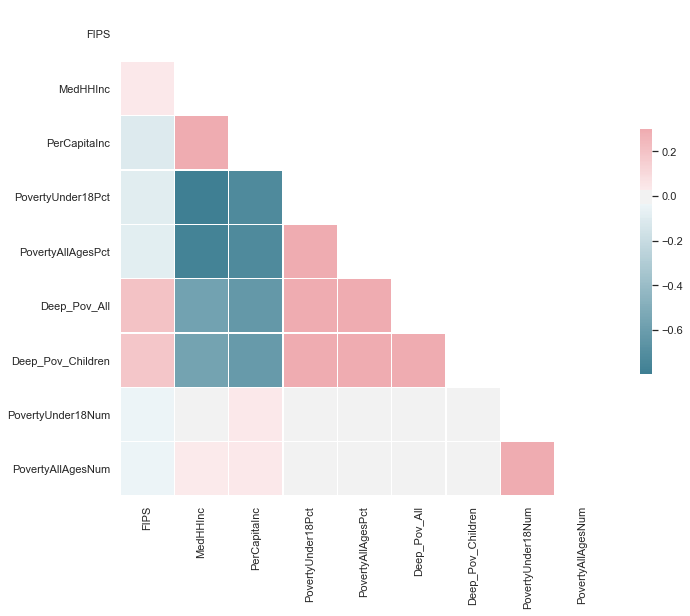

In [41]:
corr_visual(income_df)

In [42]:
# Check Datatypes are correct, *note we will change all fips to string later once all merged
income_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3278 entries, 0 to 3277
Data columns (total 11 columns):
FIPS                 3278 non-null int64
State                3278 non-null object
County               3278 non-null object
MedHHInc             3193 non-null float64
PerCapitaInc         3272 non-null float64
PovertyUnder18Pct    3193 non-null float64
PovertyAllAgesPct    3193 non-null float64
Deep_Pov_All         3272 non-null float64
Deep_Pov_Children    3271 non-null float64
PovertyUnder18Num    3193 non-null float64
PovertyAllAgesNum    3193 non-null float64
dtypes: float64(8), int64(1), object(2)
memory usage: 281.8+ KB


In [43]:
# Check null values
income_df.isnull().sum()

FIPS                  0
State                 0
County                0
MedHHInc             85
PerCapitaInc          6
PovertyUnder18Pct    85
PovertyAllAgesPct    85
Deep_Pov_All          6
Deep_Pov_Children     7
PovertyUnder18Num    85
PovertyAllAgesNum    85
dtype: int64

Luckily we don't have too many null values. Let's replace the null values with the state averages, as available.

In [44]:
income_df.groupby(['State']).mean().isnull().sum()

FIPS                 0
MedHHInc             1
PerCapitaInc         0
PovertyUnder18Pct    1
PovertyAllAgesPct    1
Deep_Pov_All         0
Deep_Pov_Children    0
PovertyUnder18Num    1
PovertyAllAgesNum    1
dtype: int64

In [45]:
print("Total # of Null Values before state-level average fillna: {}".format(income_df.isnull().sum().sum()))
income_df = income_df.fillna(income_df.groupby(['State']).transform(lambda x: x.fillna(x.mean())))
print("Total # of Remaining Null Values: {}".format(income_df.isnull().sum().sum()))

Total # of Null Values before state-level average fillna: 444
Total # of Remaining Null Values: 395


In [46]:
income_df.loc[income_df.MedHHInc.isnull()].head()

,FIPS,State,County,MedHHInc,PerCapitaInc,PovertyUnder18Pct,PovertyAllAgesPct,Deep_Pov_All,Deep_Pov_Children,PovertyUnder18Num,PovertyAllAgesNum
3199,72000,PR,Puerto Rico,NaN,12451.0,NaN,NaN,24.525430,37.073313,NaN,NaN
3200,72001,PR,Adjuntas,NaN,7126.0,NaN,NaN,37.721379,53.323029,NaN,NaN
3201,72003,PR,Aguada,NaN,9287.0,NaN,NaN,27.112576,38.965659,NaN,NaN
3202,72005,PR,Aguadilla,NaN,11339.0,NaN,NaN,31.067888,48.186813,NaN,NaN
3203,72007,PR,Aguas Buenas,NaN,10188.0,NaN,NaN,27.756086,48.414612,NaN,NaN


We can see that PR has a lot of missing values. Let's drop PR (Puerto Rico) from our df, because it's not included in the incarc_df anyways.

In [47]:
# Drop where state is PR
PR_indexnames = income_df[income_df['State'] == 'PR'].index
income_df.drop(PR_indexnames, inplace=True)

In [48]:
income_df.isnull().sum()

FIPS                 0
State                0
County               0
MedHHInc             0
PerCapitaInc         0
PovertyUnder18Pct    0
PovertyAllAgesPct    0
Deep_Pov_All         0
Deep_Pov_Children    0
PovertyUnder18Num    0
PovertyAllAgesNum    0
dtype: int64

In [49]:
# Drop redundant variables (already accounted for in incarceration df)
income_df.drop(['State', 'County'], axis=1, inplace=True)

#### People df

In [50]:
# Identify number of features to examine
people_df.shape

(3273, 90)

In [51]:
# look at all 90 variables contained in this dataframe
var_lookup_df[var_lookup_df['Category'] == 'People'].head(45)
var_lookup_df[var_lookup_df['Category'] == 'People'].tail(45)

,Cat_Sort,Category,varShort,varLong,Map
0,1,People,HH65PlusAlonePct,"Percent of persons 65 or older living alone, 2...",y
1,1,People,NaturalChangeRate0010,"Natural population change rate, 2000-10",y
2,1,People,NetMigrationRate1018,"Net migration rate, 2010-18",y
3,1,People,Under18Pct2010,"Percent of population under age 18, 2010",y
4,1,People,Ed4AssocDegreePct,"Percent of persons with an associate's degree,...",y
5,1,People,AsianNonHispanicPct2010,"Percent Non-Hispanic Asian, 2010",y
6,1,People,NonEnglishHHPct,Percent of non-English speaking households of ...,y
7,1,People,PopChangeRate1018,"Population change rate, 2010-18",y
8,1,People,Ed1LessThanHSPct,Percent of persons with no high school diploma...,y
9,1,People,Ed2HSDiplomaOnlyPct,Percent of persons with a high school diploma ...,y


,Cat_Sort,Category,varShort,varLong,Map
42,1,People,HispanicNum2010,"Population size Hispanic, 2010",y
43,1,People,MultipleRaceNum2010,"Population size multiple race, 2010",y
44,1,People,TotalPopEst2010,Population size 7/1/2010,n
45,1,People,TotalHH,"Total number of households, 2014-18",n
46,1,People,FemaleHHNum,"Number of female headed family households, 201...",n
47,1,People,TotalOccHU,"Total number of occupied housing units, 2014-18",n
48,1,People,TotalPopEst2013,Population size 7/1/2013,n
49,1,People,OwnHomeNum,"Number of owner occupied housing units, 2014-18",n
50,1,People,TotalPopEst2011,Population size 7/1/2011,n
51,1,People,HH65PlusAloneNum,Number of persons 65 years or older living alo...,n


From the above, we can surmise that some variables are going to be highly correlated, but we don't necessarily want to drop them outright just yet.  For instance, population across different years are likely to be correlated but this is helpful information considering our subset years in the county incarceration df.

Similarly with `income_df` we will not drop any vars.

In [52]:
# function to identify highly correlated features
corr_identifier(people_df, 0.85)

['NetMigrationRate1018',
 'NetMigrationRate0010',
 'NaturalChangeRate0010',
 'WhiteNonHispanicNum2010',
 'BlackNonHispanicNum2010',
 'AsianNonHispanicNum2010',
 'NativeAmericanNonHispanicNum2010',
 'HispanicNum2010',
 'MultipleRaceNum2010',
 'NonEnglishHHPct',
 'Ed5CollegePlusNum',
 'Ed3SomeCollegeNum',
 'Ed2HSDiplomaOnlyNum',
 'Ed1LessThanHSNum',
 'TotalPop25Plus',
 'TotalPopACS',
 'TotalOccHU',
 'ForeignBornAsiaPct',
 'Ed4AssocDegreeNum',
 'ForeignBornNum',
 'HH65PlusAloneNum',
 'OwnHomeNum',
 'FemaleHHNum',
 'TotalHH',
 'NonEnglishHHNum',
 'ForeignBornCentralSouthAmPct',
 'ForeignBornCentralSouthAmNum',
 'ForeignBornCaribNum',
 'ForeignBornAfricaNum',
 'ForeignBornAsiaNum',
 'ForeignBornMexNum',
 'ForeignBornEuropeNum',
 'Age65AndOlderNum2010',
 'TotalPop2010',
 'LandAreaSQMiles2010',
 'Under18Num2010',
 'Net_International_Migration_2000_2010',
 'NaturalChangeNum0010',
 'TotalPopEst2012',
 'TotalPopEst2013',
 'TotalPopEst2010',
 'TotalPopEst2014',
 'TotalPopEst2011',
 'Net_Internati

In [53]:
# Check dataypes
people_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3273 entries, 0 to 3272
Data columns (total 90 columns):
FIPS                                          3273 non-null int64
State                                         3273 non-null object
County                                        3273 non-null object
PopChangeRate1718                             3273 non-null float64
PopChangeRate1018                             3273 non-null float64
TotalPopEst2018                               3271 non-null float64
NetMigrationRate1018                          3194 non-null float64
NaturalChangeRate1018                         3194 non-null float64
Net_International_Migration_Rate_2010_2018    3194 non-null float64
PopChangeRate0010                             3267 non-null float64
NetMigrationRate0010                          3184 non-null float64
NaturalChangeRate0010                         3184 non-null float64
Immigration_Rate_2000_2010                    3184 non-null float64
PopDensity201

In [54]:
# Check null values
(people_df.isnull().sum()/len(people_df)).sort_values(ascending=False)

Immigration_Rate_2000_2010               0.027192
NaturalChangeRate0010                    0.027192
NetMigrationRate0010                     0.027192
Net_International_Migration_2000_2010    0.027192
NaturalChangeNum0010                     0.027192
                                           ...   
Ed1LessThanHSNum                         0.000000
TotalPop25Plus                           0.000000
TotalPopACS                              0.000000
TotalOccHU                               0.000000
FIPS                                     0.000000
Length: 90, dtype: float64

In [55]:
# Replace null values with State average
print("Total null values before state-level fillna: {}".format(people_df.isnull().sum().sum()))
people_df = people_df.fillna(people_df.groupby(['State']).transform(lambda x: x.fillna(x.mean())))
print("Total null values remaining after state-level fillna: {}".format(people_df.isnull().sum().sum()))

Total null values before state-level fillna: 2283
Total null values remaining after state-level fillna: 2061


In [56]:
# Drop PR
PR_indexnames = people_df[people_df['State'] == 'PR'].index
people_df.drop(PR_indexnames, inplace=True)
people_df.isnull().sum().sum()

7

In [57]:
(people_df.isnull().sum()).sort_values(ascending=False)

NaturalChangeNum0010     1
NaturalChangeRate0010    1
TotalPopEst2018          1
NetMigrationRate0010     1
NetMigrationNum0010      1
                        ..
OwnHomeNum               0
FemaleHHNum              0
TotalHH                  0
NonEnglishHHNum          0
FIPS                     0
Length: 90, dtype: int64

In [58]:
# Check remaining row with null values
people_df.loc[people_df['NaturalChangeNum0010'].isnull()].head()

,FIPS,State,County,PopChangeRate1718,PopChangeRate1018,TotalPopEst2018,NetMigrationRate1018,NaturalChangeRate1018,Net_International_Migration_Rate_2010_2018,PopChangeRate0010,...,TotalPopEst2010,TotalPopEst2014,TotalPopEst2011,Net_International_Migration_2010_2018,NaturalChange1018,TotalPopEst2015,TotalPopEst2016,TotalPopEst2017,NetMigration1018,TotalPopEstBase2010
0,0,US,United States,0.72,5.3,NaN,2.28,3.02,2.28,9.71,...,309338421,318622525,311644280,7042455.0,9338302.0,321039839,323405935,325719178,7042455.0,308758105


In [59]:
# drop US level row
US_index = people_df[people_df['State'] == 'US'].index
people_df.drop(US_index, inplace=True)
people_df.isnull().sum().sum()

0

In [60]:
# Drop redundant variables (already accounted for in incarceration df)
people_df.drop(['State', 'County', 'LandAreaSQMiles2010', ], axis=1, inplace=True)

#### Veterans df

In [61]:
# Examine the vars for the Veteran df
var_lookup_df[var_lookup_df['Category'] == 'Veterans']

,Cat_Sort,Category,varShort,varLong,Map
200,6,Veterans,BlackVetsPct,Percent of veterans that are Black or African ...,y
201,6,Veterans,CollegeDegreeVetsPct,Percent of veterans 25 and over with a Bachelo...,y
202,6,Veterans,PctVetsDisabilty,Percent of veterans age 18 to 64 with a disabi...,y
203,6,Veterans,PctNonVetsDisabilty,Percent of nonveterans age 18 to 64 with a dis...,y
204,6,Veterans,PctNonVetsPoor,Percent of nonveterans age 18 to 64 with incom...,y
205,6,Veterans,PctVetsPoor,Percent of veterans age 18 to 64 with income i...,y
206,6,Veterans,MedianNonVetsInc,Median income (In 2018 dollars) of nonveterans...,y
207,6,Veterans,FemaleVetsPct,"Percent of veterans that are female, 2014-18",y
208,6,Veterans,LFPVetsRate,Labor force participation rate for veterans ag...,y
209,6,Veterans,Vets18OPct,"Percent of the population that are veterans, 2...",y


In [62]:
# Check datatypes
veter_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3278 entries, 0 to 3277
Data columns (total 35 columns):
FIPS                    3278 non-null int64
State                   3278 non-null object
County                  3278 non-null object
Vets18OPct              3273 non-null float64
GulfWar2VetsPct         3272 non-null float64
GulfWar1VetsPct         3272 non-null float64
VietnamEraVetsPct       3272 non-null float64
KoreanWarVetsPct        3272 non-null float64
WW2VetsPct              3272 non-null float64
MaleVetsPct             3272 non-null float64
FemaleVetsPct           3272 non-null float64
WhiteNonHispVetsPct     3272 non-null float64
BlackVetsPct            3272 non-null float64
HispanicVetsPct         3272 non-null float64
OtherRaceVetsPct        3272 non-null float64
MedianVetsInc           3254 non-null float64
MedianNonVetsInc        3272 non-null float64
LessThanHSVetsPct       3272 non-null float64
HighSchOnlyVetsPct      3272 non-null float64
SomeCollegeVetsPct     

In [63]:
# Check null values
veter_df.isnull().sum()

FIPS                     0
State                    0
County                   0
Vets18OPct               5
GulfWar2VetsPct          6
GulfWar1VetsPct          6
VietnamEraVetsPct        6
KoreanWarVetsPct         6
WW2VetsPct               6
MaleVetsPct              6
FemaleVetsPct            6
WhiteNonHispVetsPct      6
BlackVetsPct             6
HispanicVetsPct          6
OtherRaceVetsPct         6
MedianVetsInc           24
MedianNonVetsInc         6
LessThanHSVetsPct        6
HighSchOnlyVetsPct       6
SomeCollegeVetsPct       6
CollegeDegreeVetsPct     6
LFPVetsRate              8
UEVetsRate               8
PctVetsPoor              8
PctNonVetsPoor           6
PctVetsDisabilty         8
PctNonVetsDisabilty      6
CivPopVets18to64Num      6
CivPop18ONum             5
Vets18ONum               5
NonVetsDisabilty         6
NonVetsPoor              6
VetsDisabilty            6
VetsPoor                 6
CLFVets18to64Num         6
dtype: int64

In [64]:
# drop PR 
PR_index = veter_df[veter_df['State'] == 'PR'].index
veter_df.drop(PR_index, inplace=True)
veter_df.isnull().sum().sum()

213

In [65]:
# Replace null values with State average
print("Total null values before state-level fillna: {}".format(veter_df.isnull().sum().sum()))
veter_df = veter_df.fillna(veter_df.groupby(['State']).transform(lambda x: x.fillna(x.mean())))
print("Total null values remaining after state-level fillna: {}".format(veter_df.isnull().sum().sum()))

Total null values before state-level fillna: 213
Total null values remaining after state-level fillna: 0


In [66]:
# Drop row with US average
veter_df = veter_df[veter_df.State != 'US']
veter_df.State.unique()

array(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
       'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
       'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'], dtype=object)

In [67]:
# Drop redundant vars, war-specific and race-specific columns
veter_df.drop(['State', 'County'], axis=1, inplace=True)

#### Jobs df

In [68]:
# Identify number of features to examine in var lookup table
len(jobs_df.columns)

66

In [69]:
# Check out variables for Jobs df
var_lookup_df[var_lookup_df['Category'] == 'Jobs'].head(33)
var_lookup_df[var_lookup_df['Category'] == 'Jobs'].tail(33)

,Cat_Sort,Category,varShort,varLong,Map
87,2,Jobs,UnempRate2017,"Unemployment rate, 2017",y
88,2,Jobs,PctEmpServices,Percent of the civilian labor force 16 and ove...,y
89,2,Jobs,PctEmpManufacturing,Percent of the civilian labor force 16 and ove...,y
90,2,Jobs,PctEmpAgriculture,Percent of the civilian labor force 16 and ove...,y
91,2,Jobs,UnempRate2018,"Unemployment rate, 2018",y
92,2,Jobs,PctEmpFIRE,Percent of the civilian labor force 16 and ove...,y
93,2,Jobs,PctEmpChange1018,"Percent employment change, 2010-18",y
94,2,Jobs,PctEmpMining,Percent of the civilian labor force 16 and ove...,y
95,2,Jobs,UnempRate2016,"Unemployment rate, 2016",y
96,2,Jobs,UnempRate2015,"Unemployment rate, 2015",y


,Cat_Sort,Category,varShort,varLong,Map
117,2,Jobs,UnempRate2009,"Unemployment rate, 2009",n
118,2,Jobs,NumCivEmployed,Civilian employed population 16 years and over...,n
119,2,Jobs,NumEmployed2008,"Employed, 2008",n
120,2,Jobs,NumCivLaborforce2015,"Civilian labor force, 2015",n
121,2,Jobs,NumEmployed2007,"Employed, 2007",n
122,2,Jobs,NumUnemployed2007,"Unemployed, 2007",n
123,2,Jobs,NumEmployed2013,"Employed, 2013",n
124,2,Jobs,UnempRate2011,"Unemployment rate, 2011",n
125,2,Jobs,UnempRate2013,"Unemployment rate, 2013",n
126,2,Jobs,NumCivLaborforce2014,"Civilian labor force, 2014",n


In [70]:
# Check datatypes
jobs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3278 entries, 0 to 3277
Data columns (total 66 columns):
FIPS                    3278 non-null int64
State                   3278 non-null object
County                  3278 non-null object
UnempRate2018           3271 non-null float64
UnempRate2017           3271 non-null float64
UnempRate2016           3271 non-null float64
UnempRate2015           3271 non-null float64
UnempRate2014           3271 non-null float64
UnempRate2010           3271 non-null float64
UnempRate2007           3269 non-null float64
PctEmpChange1018        3271 non-null float64
PctEmpChange1718        3271 non-null float64
PctEmpChange0718        3266 non-null float64
PctEmpChange0710        3266 non-null float64
PctEmpAgriculture       3272 non-null float64
PctEmpMining            3272 non-null float64
PctEmpConstruction      3272 non-null float64
PctEmpManufacturing     3272 non-null float64
PctEmpTrade             3272 non-null float64
PctEmpTrans            

In [71]:
# Check null values
(jobs_df.isnull().sum()).sort_values(ascending=False)

PctEmpChange0710        12
PctEmpChange0718        12
UnempRate2007            9
NumEmployed2008          9
NumCivLaborForce2008     9
                        ..
PctEmpGovt               6
NumCivEmployed           6
County                   0
State                    0
FIPS                     0
Length: 66, dtype: int64

In [72]:
# Drop PR and US
jobs_df = jobs_df[jobs_df.State != 'US']
jobs_df = jobs_df[jobs_df.State != 'PR']
jobs_df.isnull().sum().sum()

412

In [73]:
# Replace null values with state average
print("Total null values before state-level fillna: {}".format(jobs_df.isnull().sum().sum()))
jobs_df = jobs_df.fillna(jobs_df.groupby(['State']).transform(lambda x: x.fillna(x.mean())))
print("Total null values remaining after state-level fillna: {}".format(jobs_df.isnull().sum().sum()))

Total null values before state-level fillna: 412
Total null values remaining after state-level fillna: 0


In [74]:
# Drop redundant variables (already accounted for in incarceration df)
jobs_df.drop(['State', 'County'], axis=1, inplace=True)

#### Descriptive Stats on All County (other) DFs

In [75]:
# print the shape and descriptive stats for each county df
for i in range(0,5):
    county_dfs[i].shape
    county_dfs[i].describe()

(3278, 11)

,FIPS,MedHHInc,PerCapitaInc,PovertyUnder18Pct,PovertyAllAgesPct,Deep_Pov_All,Deep_Pov_Children,PovertyUnder18Num,PovertyAllAgesNum
count,3278.000000,3193.000000,3272.000000,3193.000000,3193.000000,3272.000000,3271.000000,3.193000e+03,3.193000e+03
mean,31329.056437,52944.895709,26725.589242,21.045443,15.125274,7.139054,10.230851,1.221190e+04,3.932257e+04
std,16328.375316,13878.755803,6941.839389,8.862190,6.092508,4.552028,7.531604,2.358859e+05,7.583740e+05
min,0.000000,25385.000000,5974.000000,2.500000,2.600000,0.000000,0.000000,5.000000e+00,5.000000e+00
25%,19019.500000,43783.000000,22556.750000,14.500000,10.800000,4.504491,5.442898,5.030000e+02,1.621000e+03
50%,30018.000000,50748.000000,26171.000000,20.100000,14.100000,6.158493,8.681186,1.200000e+03,3.876000e+03
75%,46100.500000,59020.000000,30106.750000,26.200000,18.300000,8.213555,12.552800,2.966000e+03,9.874000e+03
max,72153.000000,140382.000000,72832.000000,68.300000,54.000000,43.969687,69.205569,1.299753e+07,4.185232e+07


(3278, 66)

,FIPS,UnempRate2018,UnempRate2017,UnempRate2016,UnempRate2015,UnempRate2014,UnempRate2010,UnempRate2007,PctEmpChange1018,PctEmpChange1718,...,NumCivLaborforce2014,UnempRate2013,NumUnemployed2013,NumEmployed2013,NumCivLaborforce2013,NumUnemployed2007,NumCivLaborforce2007,NumUnemployed2012,NumEmployed2012,NumEmployed2015
count,3278.000000,3271.000000,3271.000000,3271.000000,3271.000000,3271.000000,3271.000000,3269.000000,3271.000000,3271.000000,...,3.271000e+03,3271.000000,3.271000e+03,3.271000e+03,3.271000e+03,3269.000000,3.269000e+03,3.271000e+03,3.271000e+03,3.271000e+03
mean,31329.056437,4.296729,4.796301,5.437939,5.296545,6.497310,9.594405,5.064240,3.976686,0.689037,...,9.604969e+04,7.613574,7.113584e+03,8.866868e+04,9.578226e+04,4398.955338,9.396057e+04,7.760086e+03,8.781517e+04,9.144892e+04
std,16328.375316,1.884994,2.171170,2.351560,2.471758,2.864891,3.499445,2.124838,11.316914,2.382784,...,5.883270e+05,3.133210,4.640703e+04,5.402118e+05,5.860128e+05,27607.873029,5.662391e+05,5.155553e+04,5.322877e+05,5.590742e+05
min,0.000000,1.300000,1.500000,1.700000,1.000000,1.200000,2.100000,1.500000,-32.680000,-13.450000,...,7.900000e+01,1.200000,4.000000e+00,7.100000e+01,7.500000e+01,3.000000,4.100000e+01,4.000000e+00,6.300000e+01,7.300000e+01
25%,19019.500000,3.150000,3.500000,4.000000,4.000000,4.700000,7.300000,3.700000,-2.950000,-0.320000,...,5.046500e+03,5.500000,3.765000e+02,4.696500e+03,5.123000e+03,261.000000,5.292000e+03,4.050000e+02,4.734500e+03,4.719000e+03
50%,30018.000000,3.900000,4.400000,5.000000,5.000000,6.100000,9.300000,4.700000,3.350000,0.690000,...,1.169900e+04,7.300000,9.620000e+02,1.081600e+04,1.187000e+04,650.000000,1.239600e+04,1.043000e+03,1.095700e+04,1.091000e+04
75%,46100.500000,4.900000,5.400000,6.200000,6.000000,7.600000,11.500000,5.800000,9.520000,1.635000,...,3.263050e+04,9.100000,2.495500e+03,3.047200e+04,3.278650e+04,1720.000000,3.309500e+04,2.686500e+03,3.045400e+04,3.081400e+04
max,72153.000000,19.900000,20.600000,24.100000,24.000000,26.400000,28.800000,20.400000,151.200000,38.850000,...,1.871471e+07,27.400000,1.666589e+06,1.695840e+07,1.862499e+07,961490.000000,1.789308e+07,1.921121e+06,1.660267e+07,1.768185e+07


(3273, 90)

,FIPS,PopChangeRate1718,PopChangeRate1018,TotalPopEst2018,NetMigrationRate1018,NaturalChangeRate1018,Net_International_Migration_Rate_2010_2018,PopChangeRate0010,NetMigrationRate0010,NaturalChangeRate0010,...,TotalPopEst2010,TotalPopEst2014,TotalPopEst2011,Net_International_Migration_2010_2018,NaturalChange1018,TotalPopEst2015,TotalPopEst2016,TotalPopEst2017,NetMigration1018,TotalPopEstBase2010
count,3273.000000,3273.000000,3273.000000,3.271000e+03,3194.000000,3194.000000,3194.000000,3267.000000,3184.000000,3184.000000,...,3.273000e+03,3.273000e+03,3.273000e+03,3.194000e+03,3.194000e+03,3.273000e+03,3.273000e+03,3.273000e+03,3.194000e+03,3.273000e+03
mean,31358.511763,0.109096,0.680251,2.010180e+05,-0.009534,1.027195,0.908262,5.198096,0.996768,2.838059,...,2.858031e+05,2.940621e+05,2.878588e+05,6.910935e+03,9.389458e+03,2.962027e+05,2.983079e+05,3.002370e+05,6.910935e+03,2.852816e+05
std,16305.188962,1.326980,7.829791,1.242285e+06,6.561011,3.276712,1.560002,13.032755,11.135502,4.706620,...,5.528059e+06,5.695142e+06,5.569541e+06,1.299986e+05,1.734729e+05,5.738704e+06,5.781195e+06,5.822429e+06,1.380524e+05,5.517676e+06
min,0.000000,-6.500000,-26.150000,8.800000e+01,-25.880000,-9.340000,-0.910000,-46.600000,-57.430000,-14.480000,...,8.400000e+01,8.900000e+01,9.000000e+01,-1.018000e+03,-2.606800e+04,8.800000e+01,8.800000e+01,8.800000e+01,-5.205930e+05,8.200000e+01
25%,19025.000000,-0.540000,-3.920000,1.132200e+04,-3.670000,-1.110000,0.090000,-2.510000,-5.115000,-0.260000,...,1.155600e+04,1.150600e+04,1.148700e+04,1.200000e+01,-1.500000e+02,1.137800e+04,1.140200e+04,1.134300e+04,-7.597500e+02,1.157800e+04
50%,30021.000000,0.110000,-0.440000,2.671800e+04,-0.980000,0.620000,0.400000,3.180000,-0.350000,2.360000,...,2.685200e+04,2.693800e+04,2.683100e+04,8.800000e+01,9.500000e+01,2.683000e+04,2.661200e+04,2.667400e+04,-1.260000e+02,2.692900e+04
75%,46101.000000,0.790000,4.130000,7.123450e+04,2.700000,2.770000,1.100000,10.155000,5.355000,5.270000,...,7.056200e+04,7.129500e+04,7.061100e+04,5.160000e+02,1.236750e+03,7.111200e+04,7.140300e+04,7.140400e+04,8.037500e+02,7.040500e+04
max,72153.000000,11.760000,112.630000,3.955704e+07,96.860000,20.490000,24.070000,110.350000,85.200000,26.410000,...,3.093384e+08,3.186225e+08,3.116443e+08,7.042455e+06,9.338302e+06,3.210398e+08,3.234059e+08,3.257192e+08,7.042455e+06,3.087581e+08


(232, 5)

,Cat_Sort
count,232.000000
mean,2.642241
std,1.793816
min,1.000000
25%,1.000000
50%,2.000000
75%,4.000000
max,6.000000


(3199, 35)

,FIPS,Vets18OPct,GulfWar2VetsPct,GulfWar1VetsPct,VietnamEraVetsPct,KoreanWarVetsPct,WW2VetsPct,MaleVetsPct,FemaleVetsPct,WhiteNonHispVetsPct,...,PctVetsDisabilty,PctNonVetsDisabilty,CivPopVets18to64Num,CivPop18ONum,Vets18ONum,NonVetsDisabilty,NonVetsPoor,VetsDisabilty,VetsPoor,CLFVets18to64Num
count,3199.000000,3194.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,...,3191.000000,3193.000000,3.193000e+03,3.194000e+03,3.194000e+03,3.193000e+03,3.193000e+03,3.193000e+03,3193.000000,3.193000e+03
mean,30322.808378,8.899024,14.507418,17.328918,38.938604,9.629143,4.129979,92.917428,7.082572,85.103946,...,21.545136,13.043538,6.734755e+03,2.332400e+05,1.748099e+04,1.731793e+04,2.338480e+04,1.579567e+03,737.759161,8.830464e+03
std,15204.441712,2.643254,7.595777,7.278500,7.192631,4.322867,2.685281,3.794768,3.794768,15.887238,...,9.904103,4.597845,1.293139e+05,4.492881e+06,3.354921e+05,3.325739e+05,4.510179e+05,3.030381e+04,14163.149856,1.695350e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,54.375000,0.000000,0.000000,...,0.000000,1.771872,0.000000e+00,7.100000e+01,0.000000e+00,5.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,18166.000000,7.328652,9.912854,12.885258,34.953825,7.031992,2.461390,91.170007,4.828042,78.520801,...,15.475137,9.771987,2.160000e+02,8.646250e+03,7.540000e+02,7.700000e+02,8.790000e+02,6.300000e+01,27.000000,3.210000e+02
50%,29171.000000,8.690512,13.392128,16.505084,38.522727,9.161577,3.795445,93.295719,6.704281,91.336707,...,20.131291,12.379578,5.710000e+02,2.048550e+04,1.769000e+03,1.970000e+03,2.223000e+03,1.850000e+02,81.000000,8.230000e+02
75%,45074.000000,10.122480,17.699473,20.705409,42.743106,11.556604,5.263158,95.171958,8.829993,96.119929,...,26.346752,15.660533,1.862000e+03,5.667650e+04,5.199750e+03,5.111000e+03,5.852000e+03,4.920000e+02,221.000000,2.544000e+03
max,56045.000000,25.523797,74.230331,100.000000,100.000000,57.142857,29.729730,100.000000,45.625000,100.000000,...,89.473684,35.424901,7.168168e+06,2.483228e+08,1.861143e+07,1.843304e+07,2.489117e+07,1.681238e+06,785277.000000,9.398789e+06


### Merge dfs

Now that we have done taken an initial look at each of the dataframes, we will proceed with merging them into one large dataframe so that we can address remaining issues with null values, data types, and multicollinearity.

We will use the `fips` variable to merge across the dataframes.

In [76]:
# Calculate expected number of columns in merged dataframes
length = len(cty_df.columns) + len(income_df.columns) + len(people_df.columns) + \
len(veter_df.columns) + len(jobs_df.columns) - 4

print("Expected # of columns in new df: {}".format(length))

Expected # of columns in new df: 639


In [77]:
# Merge other other county level dataframes
cty_other = pd.merge((pd.merge(income_df, people_df, on="FIPS")), veter_df, on="FIPS")
cty_other = pd.merge(cty_other, jobs_df, on="FIPS")
cty_other.shape

(3193, 190)

In [78]:
# Rename fips column in county df to match the other dfs
cty_df.rename(columns={'fips':'FIPS'}, inplace=True)

# Merge all dataframes on fips id, unique id for each county
data = pd.merge(cty_df, cty_other, on='FIPS')
data.shape

(3108, 639)

In [79]:
# Final check on null values for merged dataframe
data.isnull().sum().sum()

0

In [80]:
# Change datatype of FIPS to str
data['FIPS'] = data['FIPS'].astype(str)

In [81]:
# Set a dict with FIPS and county name, then drop county name from df
cty_name = data[['FIPS', 'county_name', 'state']].copy()
cty_name_dict = cty_name.set_index('FIPS').T.to_dict('list')

In [82]:
# preview first 4 pairs in dict
{k: cty_name_dict[k] for k in list(cty_name_dict)[:4]}

{'1001': ['Autauga County', 'AL'],
 '1003': ['Baldwin County', 'AL'],
 '1005': ['Barbour County', 'AL'],
 '1007': ['Bibb County', 'AL']}

In [83]:
# drop county_name as this doesn't add anlaytical value to our model
data.drop('county_name', axis=1, inplace=True)

In [84]:
# save cleaned dataframe as a csv file
data.to_csv("Data/cleaned_data_incarc.csv")

**Summary of *SCRUB* step:** 
- Incarceration data: 
    - Subset for years of interest (2008-2017)
    - Removed Prison Data, keeping only jail data
    - Deal with null values by first replacing nulls with county-level means (average over the 10 years of data), then state-level means
    - Transform the dataframe so that each year (originally provided per row) into columns
- County-level data (income, people, veterans, jobs):
    - Examine vars contained in variable look up table
    - Check datatypes
    - Deal with Null values (replacing nulls with state averages)
    - Drop redundant variables
- Merge all dataframes on FIPS
- Final Null value check

## **Explore**

**Planned tasks:**

1. Transform target variable into var with class labels.
2. Set aside test-set.
2. Explore and visualize numerical and categorical data.
3. Deal with categorical data - dummies.
4. Apply final transformation to test data.

In [85]:
# set style, size, palette for all plots
sns.set_style("whitegrid") 
sns.set(rc={'figure.figsize':(14,10)})
sns.set_palette('Set2')
plt.rcParams["axes.labelsize"] = 14

### Target and Features

Our target variable is the the most recent jail incarceration rate, which in our case is for 2017. This rate comes from the Vera dataset, with the following description per the Vera codebook: 

*Incarceration rates are calculated using the resident population aged 15-64. This provides a more accurate picture of prevalence because individuals in the age ranges outside of this (<15 or >64) are at very low risk of jail incarceration. Additionally, the proportion of these age groups can vary greatly county by county, with some counties having a higher proportion of elderly or youths.*

Since we transformed our original incarceration dataframe to include columns for each year (per var), we will use the latest incarceration rate (2017) as our target variable. Since we want to ultimately run a classification model, we will need to transform our target variable into class labels.

In [86]:
# Run descriptive stats on target variable
data.total_jail_pop_rate_2017.describe()

count     3108.000000
mean       600.173888
std       1316.225396
min          0.000000
25%        243.980000
50%        389.050000
75%        603.397500
max      26433.190000
Name: total_jail_pop_rate_2017, dtype: float64

Before we start, we should address the fact that we have 0's in our incarceration rate column, which is unexpected. We'll investigate further below

In [87]:
print("Number of counties with 0 as incarceration rate: {}".format(len(data.loc[data.total_jail_pop_rate_2017==0])))

Number of counties with 0 as incarceration rate: 5


In [88]:
no_incarc = data.loc[data.total_jail_pop_rate_2017==0].copy()
no_incarc.head()
no_incarc.filter(regex=("total_jail_pop_rate*"))

,FIPS,state,urbanicity,region,division,commuting_zone,land_area,private_jail_flag,regional_jail_flag,total_pop_2008,...,NumCivLaborforce2014,UnempRate2013,NumUnemployed2013,NumEmployed2013,NumCivLaborforce2013,NumUnemployed2007,NumCivLaborforce2007,NumUnemployed2012,NumEmployed2012,NumEmployed2015
998,21033,KY,rural,South,East South Central,331.0,344.79,0.0,1.0,12985.0,...,5452.0,8.2,461.0,5171.0,5632.0,351.0,6630.0,472.0,5205.0,5003.0
1053,21143,KY,rural,South,East South Central,331.0,213.84,0.0,1.0,8374.0,...,2982.0,8.2,254.0,2838.0,3092.0,209.0,3278.0,285.0,2817.0,2700.0
1308,27011,MN,rural,Midwest,West North Central,479.0,499.03,0.0,1.0,5328.0,...,2593.0,5.4,138.0,2419.0,2557.0,133.0,2801.0,148.0,2682.0,2563.0
1377,27149,MN,rural,Midwest,West North Central,451.0,563.61,0.0,1.0,9711.0,...,5569.0,3.8,207.0,5303.0,5510.0,210.0,5640.0,237.0,5369.0,5549.0
1380,27155,MN,rural,Midwest,West North Central,479.0,573.87,0.0,1.0,3637.0,...,1712.0,5.1,84.0,1576.0,1660.0,95.0,1839.0,89.0,1686.0,1759.0


,total_jail_pop_rate_2008,total_jail_pop_rate_2009,total_jail_pop_rate_2010,total_jail_pop_rate_2011,total_jail_pop_rate_2012,total_jail_pop_rate_2013,total_jail_pop_rate_2014,total_jail_pop_rate_2015,total_jail_pop_rate_2016,total_jail_pop_rate_2017
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1053,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1308,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1377,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1380,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Based on the above, we can see that these 5 counties located in KY and MN, do not have any incarceration rates across any of the years of data included. We will drop these 5 rows and proceed.

In [89]:
# Drop the FIPS with no incarceration data from df
no_incarc_FIPS = list(no_incarc.FIPS)
no_incarc_index = data[data['FIPS'].isin(no_incarc_FIPS)].index
data.drop(no_incarc_index, inplace=True)

Let's take a quick look at the distribution of out target variable before we impose the class labels onto it.

In [90]:
# Descriptive statistics on target var
data.total_jail_pop_rate_2017.describe()

count     3103.000000
mean       601.140974
std       1317.065002
min          4.260000
25%        245.120000
50%        389.140000
75%        603.970000
max      26433.190000
Name: total_jail_pop_rate_2017, dtype: float64

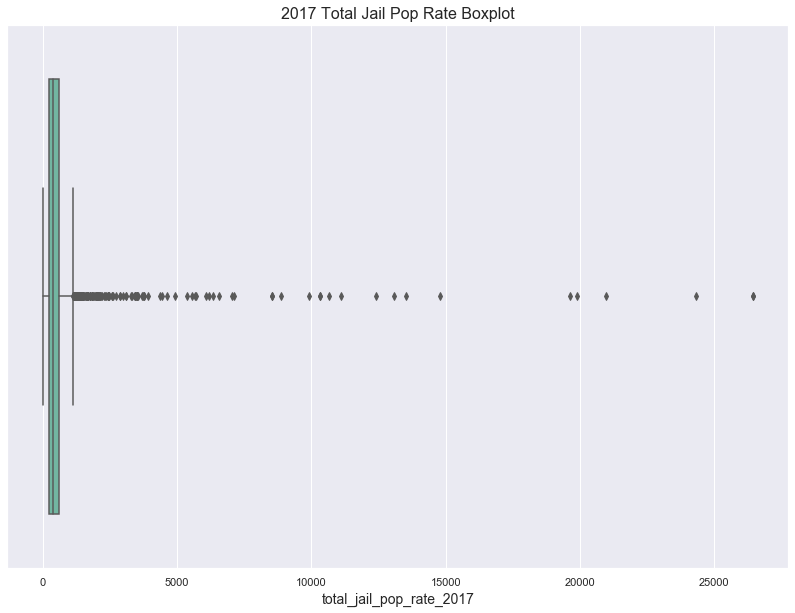

In [91]:
# Boxplot of 2017 incarceration rate
sns.boxplot(x=data['total_jail_pop_rate_2017'])
plt.title("2017 Total Jail Pop Rate Boxplot", fontsize=16);

From the above we can see that we have some counties with extremely high incarceration rates. Let's quickly examine these, however we will refrain from dropping any more observations because these will be categorized into class labels based on above or below the U.S. average incarceration rate for 2017.

In [92]:
# Look at observations with rates above 10,000
print("Total Number of counties with rates above 8,000: {}".format(len(data.loc[data.total_jail_pop_rate_2017>8000])))
data.loc[data.total_jail_pop_rate_2017>8000, ['state', 'total_jail_pop_rate_2017', 
                                               'total_jail_pop_2017', 'total_pop_2017']]

Total Number of counties with rates above 8,000: 18


,state,total_jail_pop_rate_2017,total_jail_pop_2017,total_pop_2017
452,GA,14795.50,908.00,9383.0
457,GA,19900.75,1163.00,8774.0
1114,LA,12411.85,792.00,9833.0
1116,LA,8859.04,1108.00,19849.0
1119,LA,24304.35,1118.00,7133.0
1126,LA,10654.49,1050.00,15893.0
1134,LA,11108.14,830.00,11343.0
1417,MS,8520.48,85.29,1341.0
1452,MS,8520.40,229.71,4423.0
1637,MT,19618.27,627.00,4881.0


Interestingly, over half (10) of these counties with very high incarceration rates are located in Louisiana or Texas. They also have relatively small population sizes, which might contribute to the high incarceration rate, as these rates are provided per 100,000 people, and in this dataset they are calculated as a proportion of the population aged 15-64.

Let's proceed with categorizing/labeling our data.

#### Categorize Target Variable Rates

In order to figure out our labels, we will quickly test two different approaches based on incarceration rate benchmarks, including:
- The U.S. jail incarceration rate in 2017 according to the BJS = 229;
- Using only the county-level data, a comparison of the 2017 rate versus the average rate from 2008-2016 (this will be the winner).

The U.S. jail incarceration rate in 2017 according to the BJS is 229 per 100,000 residents. Also, according to the BJS, "the jail incarceration rate decreased by 12% from 2007 to 2017, from 259 to 229 jail inmates per 100,000 U.S. residents, but did not decline from 2016 to 2017." 

[credit: https://www.bjs.gov/content/pub/press/p17ji17pr.cfm]

Based on this 229 rate, let's see how our data splits into above or at/below the U.S. average.

In [93]:
print("Total number of counties above the U.S. average incarceration rate for jails: {}". \
      format(len(data.loc[data['total_jail_pop_rate_2017']>229])))

print("Total number of counties at or below the U.S. average incarceration rate for jails: {}". \
      format(len(data.loc[data['total_jail_pop_rate_2017']<=229])))

Total number of counties above the U.S. average incarceration rate for jails: 2410
Total number of counties at or below the U.S. average incarceration rate for jails: 693


From the above, we can see that proceeding with an above or at/below the U.S. average will result in a serious class imbalance issue. Furthermore, since this is an external benchmark without much visibility into how the average was calculated, let's consider using our existing data by creating an average jail incarceration rate from preceding years (2008 to 2016) and then comparing this with the 2017 rate (per county).

In [94]:
# create a new column of average incarc rate from 2008-2016
data['incarc_rate_avg_2008_2016'] = data[["total_jail_pop_rate_2008", "total_jail_pop_rate_2009", "total_jail_pop_rate_2010", 
              "total_jail_pop_rate_2011", "total_jail_pop_rate_2012", "total_jail_pop_rate_2013", 
              "total_jail_pop_rate_2014", "total_jail_pop_rate_2015", "total_jail_pop_rate_2016"]].mean(axis=1)


In [95]:
# Create function that operates on rows to create class label based on the two columns of interest
def change_label(row):
    if row['total_jail_pop_rate_2017'] > row['incarc_rate_avg_2008_2016']:
        val = "Increase"
    else:
        val = "Same or Decrease"
    return val

In [96]:
# Apply the function to our dataframe
data['incarc_rate_change_2017'] = data.apply(change_label, axis=1)
data['incarc_rate_change_2017'].value_counts(normalize=True)

Increase            0.610055
Same or Decrease    0.389945
Name: incarc_rate_change_2017, dtype: float64

From the above, we have a much better balance in our labels of "Increase" and "Same or Decrease" with a roughly 60/40 split. Since most ML algorithms expect numbers, let's quickly cast the target variable to integers, where 1 represents "Increase" and 0 represents "Same or Decrease." But first, let's quickly visualize our target var with the descriptive string labels.

In [97]:
# Quick look at our target variable
data[['state', 'total_jail_pop_rate_2017', 'total_jail_pop_2017', 
                                  'total_pop_2017', 'incarc_rate_change_2017']].head()

,state,total_jail_pop_rate_2017,total_jail_pop_2017,total_pop_2017,incarc_rate_change_2017
0,AL,453.90,165.0,55443.0,Increase
1,AL,476.27,629.0,212619.0,Same or Decrease
2,AL,690.04,111.0,25158.0,Increase
3,AL,502.71,76.0,22555.0,Increase
4,AL,367.77,134.0,57827.0,Increase


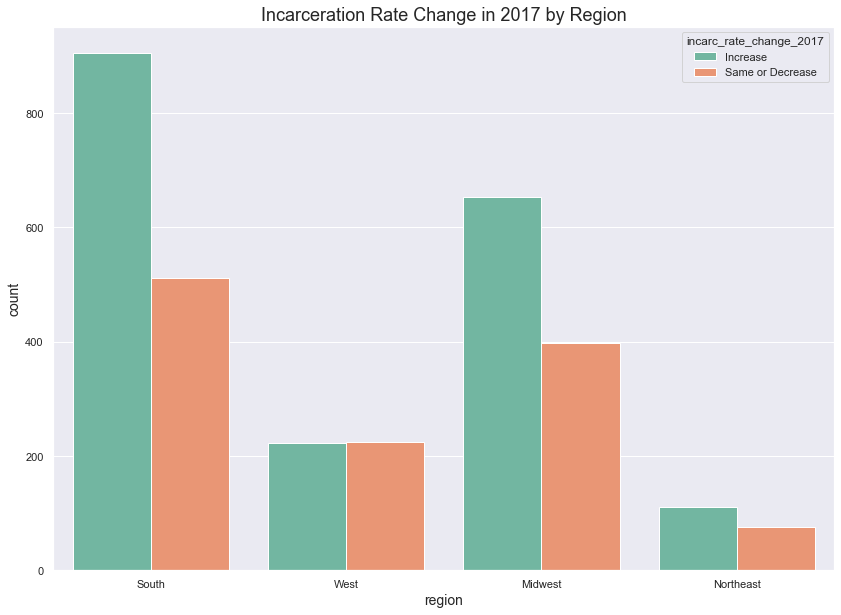

In [98]:
# Quick visualization of our target var labels by region
sns.countplot('region', data=data, hue="incarc_rate_change_2017")
plt.title("Incarceration Rate Change in 2017 by Region", fontsize=18)
plt.show();

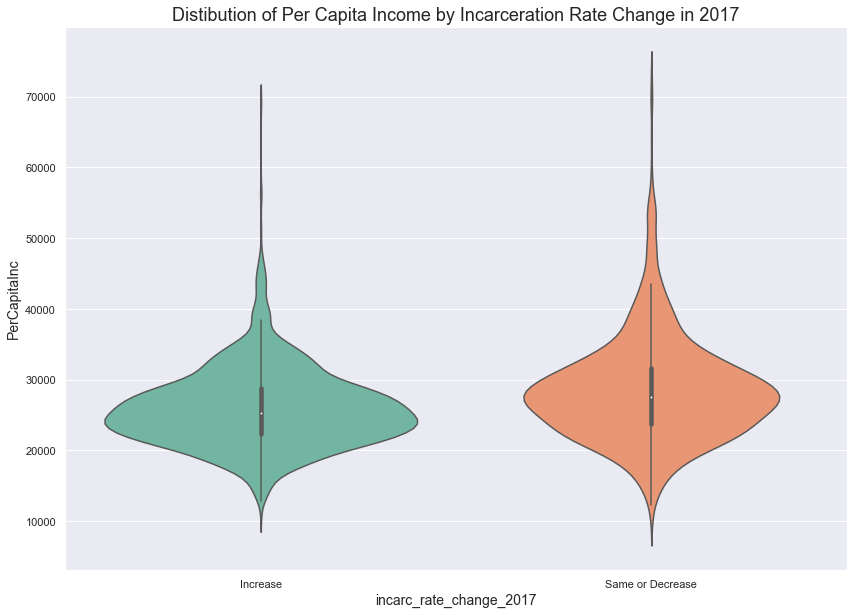

In [99]:
# Plot violin plot of target var and per capita income
sns.violinplot(x="incarc_rate_change_2017", y="PerCapitaInc", data=data)
plt.title("Distibution of Per Capita Income by Incarceration Rate Change in 2017", fontsize=18)
plt.show();

The violin plot above displays the distribution of per capita income data across our two labels, featuring a kernel density estimation of the underlying distribution. We can see that the largest distribution of data for counties with increased incarceration rates correspond to a slightly lower per capita income compared to counties with the same or decreased incarceration rate in 2017 (relative to the average over 2008-2016 per county).

### Set Aside Test Set

In order to avoid any data snooping bias, we will create our test set now, using 20% of our dataframe to set aside now.

Let's also set FIPS as our index so that we can retain the unique id for each county without including the 3000+ unique id's as categorical features in our data.

In [100]:
# Set FIPS as our index
data.set_index('FIPS', inplace=True)
data.shape

(3103, 639)

In [101]:
# Make our features and target variable before splitting into train test split
X = data.drop('incarc_rate_change_2017', axis=1).copy()
y = data['incarc_rate_change_2017'].copy()

In [102]:
# Print shapes of before and after the train test split
print("Shape of X: {}".format(X.shape))
print("Shape of y: {}".format(y.shape))

# perform train test split with 20% set aside as test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("/n Training data shape of X and y: ")
X_train.shape
y_train.shape
print("Test data shape of X and y: ")
X_test.shape
y_test.shape

Shape of X: (3103, 638)
Shape of y: (3103,)
/n Training data shape of X and y: 


(2482, 638)

(2482,)

Test data shape of X and y: 


(621, 638)

(621,)

We will also set aside a subset of the data with all incarceration related data (except the target variable) removed. We'll label this as "2" because this will be the second set of models we run, to compare classification capabilities of county-level data without any incarceration data.

In [103]:
# Identify column index to use for dropping incarceration data
X.columns[97:99]
X.columns[447:449]

Index(['white_pop_15to64_2017', 'total_jail_pop_2008'], dtype='object')

Index(['total_jail_pretrial_rate_2017', 'MedHHInc'], dtype='object')

In [104]:
# Create separate df without any additional incarceration rate
X2 = X.drop(X.iloc[:, 98:448], axis=1).copy()
X2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3103 entries, 1001 to 56045
Columns: 288 entries, state to incarc_rate_avg_2008_2016
dtypes: category(2), float64(251), int64(31), object(4)
memory usage: 6.8+ MB


In [105]:
# make copy of target variable
y2 = y.copy()

In [106]:
# Print shapes of before and after the train test split
print("Shape of X_no_incarc: {}".format(X2.shape))
print("Shape of y_no_incarc: {}".format(y2.shape))

# perform train test split with 20% set aside as test data
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)
print("/n Training data shape of X and y: ")
X2_train.shape
y2_train.shape
print("Test data shape of X and y: ")
X2_test.shape
y2_test.shape

Shape of X_no_incarc: (3103, 288)
Shape of y_no_incarc: (3103,)
/n Training data shape of X and y: 


(2482, 288)

(2482,)

Test data shape of X and y: 


(621, 288)

(621,)

Now that we have set aside our test data, we will continue with exploring our training data.  We'll make a copy of the training set to avoid making any harmful changes to the original training data.  We'll use the full version of data, with incarceration data, during exploration.

In [107]:
# Make copy of features and target variables from training data for exploration
feats = X_train.copy()
target = y_train.copy()
feats_target = pd.merge(feats, target, left_index=True, right_index=True)

# Save exploratory training data as csv
feats_target.to_csv("Data/training_data_incarc_explor.csv")

In [108]:
# Identify numeric and categorical vars
categ_feats = feats.select_dtypes(exclude=['int', 'float']).copy()
num_feats = feats.select_dtypes(['int', 'float']).copy()

### Categorical Data EDA

We are going to append the target variable so that we can investigate and visualize the relationships between our data and increases or decreases/steadiness in incarceration rates.

In [109]:
# merge categ dataframe with target var using the index
categ_feats_targ = pd.merge(categ_feats, target, left_index=True, right_index=True)
categ_feats_targ.head()

,state,urbanicity,region,division,private_jail_flag,regional_jail_flag,incarc_rate_change_2017
FIPS,,,,,,,
39161,OH,rural,Midwest,East North Central,0.0,0.0,Increase
31177,NE,small/mid,Midwest,West North Central,0.0,1.0,Same or Decrease
5115,AR,rural,South,West South Central,0.0,0.0,Increase
48189,TX,rural,South,West South Central,0.0,0.0,Same or Decrease
51620,VA,rural,South,South Atlantic,0.0,1.0,Increase


In [110]:
# distribution of counties per Division
categ_feats_targ.division.value_counts(normalize=True)

West North Central    0.226027
South Atlantic        0.183723
West South Central    0.150685
East North Central    0.121676
East South Central    0.116841
Mountain              0.079371
Middle Atlantic       0.056809
Pacific               0.052377
New England           0.012490
Name: division, dtype: float64

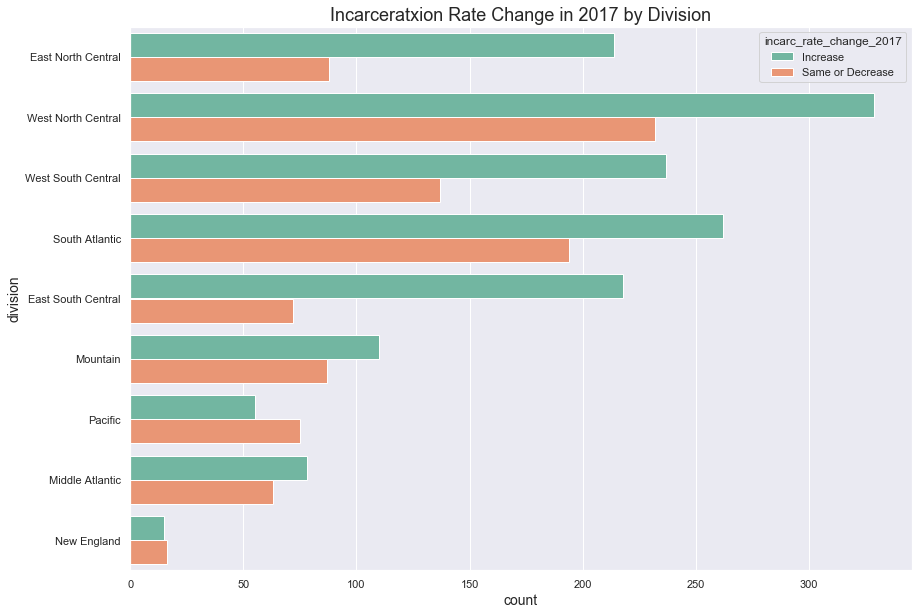

In [111]:
# plot target variable by division of the U.S.
sns.countplot(y='division', data=categ_feats_targ, hue="incarc_rate_change_2017")
plt.title("Incarceratxion Rate Change in 2017 by Division", fontsize=18)
plt.show();

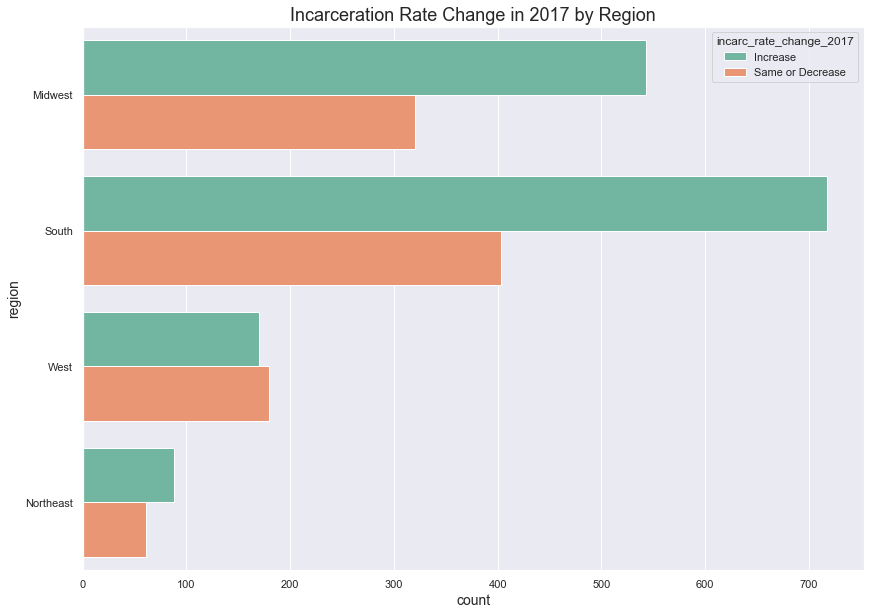

In [112]:
# plot target variable by region of the U.S.
sns.countplot(y='region', data=categ_feats_targ, hue="incarc_rate_change_2017")
plt.title("Incarceration Rate Change in 2017 by Region", fontsize=18)
plt.show();

The only region where the number of counties with increased rates doesn't surpass the number of counties with the same/decreased incarceration rates is the West. All other regions, especially the South and Midwest have far more counties with increased rates than not.

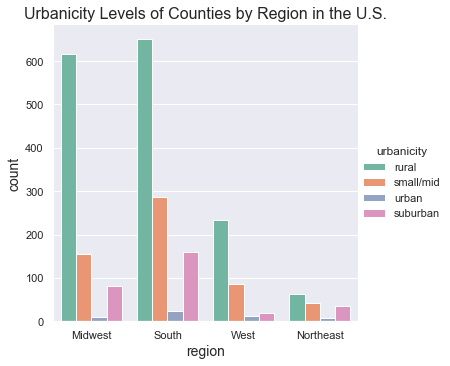

In [113]:
# visualize counts of counties by urbanicity category in each region
sns.catplot(x='region', hue='urbanicity', kind="count", data=categ_feats_targ)
plt.title("Urbanicity Levels of Counties by Region in the U.S.", fontsize=16)
plt.show();

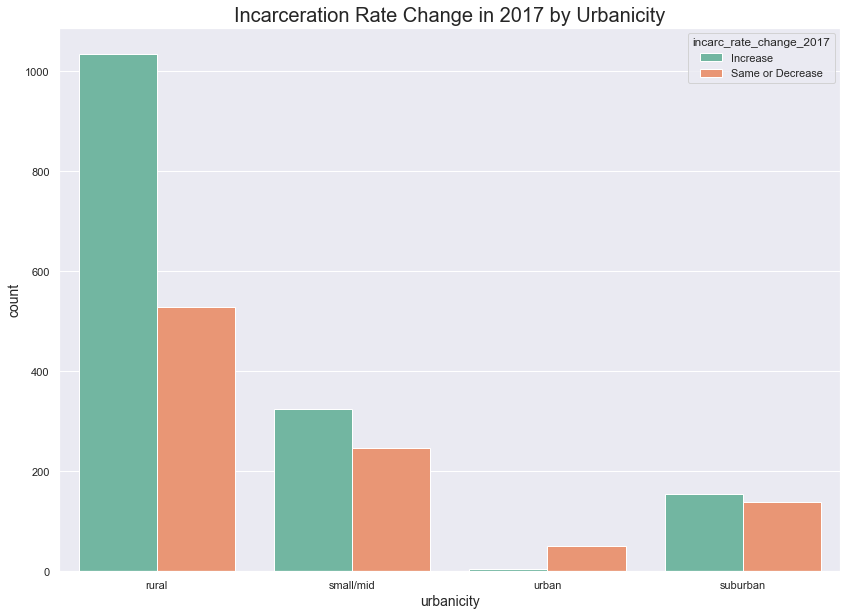

In [114]:
# countplot of target var labels by urbanicity category
sns.countplot('urbanicity', data=categ_feats_targ, hue="incarc_rate_change_2017")
plt.title("Incarceration Rate Change in 2017 by Urbanicity", fontsize=20)
plt.show();

Interestingly, we can see that a large share of the Increased rates are in rural counties, far outnumbering the number of rural counties with decreased/steady incarceration rates by almost two-fold. By comparison, it appears that for the small/mid size counties and suburban counties, the number of counties with increased rates is only slightly bigger than the alternative. In urban counties, which are the fewest compared to the other urbanicity categories, we see more urban counties with the same or decreased rates than those with increased rates.

### Numerical Data EDA

Most of our features are numerical, so we won't be able to visualize everything. Perhaps after some feature selection we can revisit the exploration and visualizations possible. For now, we will select a few features from each of our data sources (incarceration, population, income, jobs, veterans).

In [115]:
# merge categ dataframe with target var using the index
num_feats_targ = pd.merge(num_feats, target, left_index=True, right_index=True)
num_feats_targ.describe()

,commuting_zone,land_area,total_pop_2008,total_pop_2009,total_pop_2010,total_pop_2011,total_pop_2012,total_pop_2013,total_pop_2014,total_pop_2015,...,UnempRate2013,NumUnemployed2013,NumEmployed2013,NumCivLaborforce2013,NumUnemployed2007,NumCivLaborforce2007,NumUnemployed2012,NumEmployed2012,NumEmployed2015,incarc_rate_avg_2008_2016
count,2482.000000,2482.000000,2.482000e+03,2.482000e+03,2.482000e+03,2.482000e+03,2.482000e+03,2.482000e+03,2.482000e+03,2.482000e+03,...,2482.000000,2482.000000,2.482000e+03,2.482000e+03,2482.000000,2.482000e+03,2482.000000,2.482000e+03,2.482000e+03,2482.000000
mean,279.431507,1129.165274,9.670955e+04,9.757753e+04,9.838795e+04,9.912722e+04,9.988590e+04,1.006023e+05,1.013689e+05,1.021437e+05,...,7.350717,3506.853505,4.491158e+04,4.841844e+04,2182.957033,4.743245e+04,3836.358340,4.447184e+04,4.631773e+04,544.701085
std,189.965619,3891.279906,3.440716e+05,3.472211e+05,3.499459e+05,3.533699e+05,3.569718e+05,3.602246e+05,3.634110e+05,3.665507e+05,...,2.674403,13090.890291,1.480498e+05,1.607446e+05,7286.451112,1.549321e+05,14516.610405,1.452204e+05,1.540554e+05,1029.023833
min,1.000000,2.050000,0.000000e+00,0.000000e+00,9.000000e+01,9.000000e+01,8.900000e+01,8.900000e+01,8.900000e+01,8.800000e+01,...,1.400000,11.000000,2.040000e+02,2.210000e+02,6.000000,1.750000e+02,11.000000,2.150000e+02,1.930000e+02,5.115556
25%,109.000000,429.495000,1.100125e+04,1.097350e+04,1.098025e+04,1.092950e+04,1.084925e+04,1.079000e+04,1.081850e+04,1.082625e+04,...,5.500000,347.250000,4.572750e+03,4.923250e+03,242.000000,5.121000e+03,372.000000,4.588000e+03,4.588500e+03,241.656538
50%,258.000000,611.870000,2.564100e+04,2.577850e+04,2.578150e+04,2.572000e+04,2.565450e+04,2.566400e+04,2.559050e+04,2.557500e+04,...,7.200000,909.500000,1.064300e+04,1.143200e+04,607.000000,1.217500e+04,976.000000,1.072850e+04,1.075900e+04,379.152222
75%,428.000000,926.790000,6.451850e+04,6.516625e+04,6.539900e+04,6.562650e+04,6.557400e+04,6.560100e+04,6.564725e+04,6.585825e+04,...,8.900000,2330.500000,2.828150e+04,3.080050e+04,1538.500000,3.127225e+04,2505.500000,2.841625e+04,2.885875e+04,580.219444
max,903.000000,145572.460000,9.735147e+06,9.787400e+06,9.822433e+06,9.876727e+06,9.938436e+06,9.998105e+06,1.004841e+07,1.009704e+07,...,25.500000,484573.000000,4.482594e+06,4.967167e+06,249384.000000,4.864160e+06,536871.000000,4.378392e+06,4.659651e+06,25030.198889


Mean Per Capita Inc for counties with Increased Incarceration Rates: 26021.038208168644
Mean Per Capita Inc for counties with Steady/Decreased Incarceration Rates: 28689.144725260907


Ttest_indResult(statistic=-10.129076405690073, pvalue=1.176515670350429e-23)

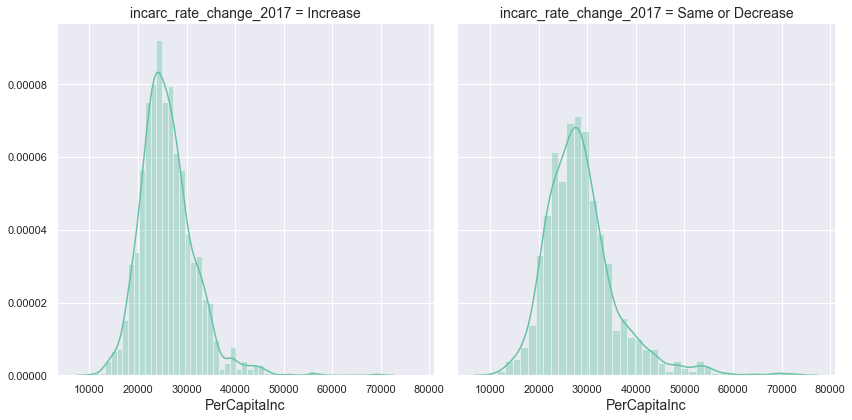

In [116]:
# plot histograms of per capita income by incarc rate change
g = sns.FacetGrid(feats_target, col="incarc_rate_change_2017", height=6, aspect=1)
g = g.map(sns.distplot, "PerCapitaInc")

# conduct a 2-sided ttest
increase_inc = feats_target.loc[feats_target['incarc_rate_change_2017'] == "Increase"]['PerCapitaInc']
decrease_inc = feats_target.loc[feats_target['incarc_rate_change_2017'] == "Same or Decrease"]['PerCapitaInc']
print("Mean Per Capita Inc for counties with Increased Incarceration Rates: {}".format(increase_inc.mean()))
print("Mean Per Capita Inc for counties with Steady/Decreased Incarceration Rates: {}".format(decrease_inc.mean()))
stats.ttest_ind(increase_inc, decrease_inc)

The side by side histograms above show relatively normal distributions across both labels (comparing counties with increased versus decreased/steady rates), however the results of the 2-sided ttest confirm that the distributions' means are statistically different from each other.

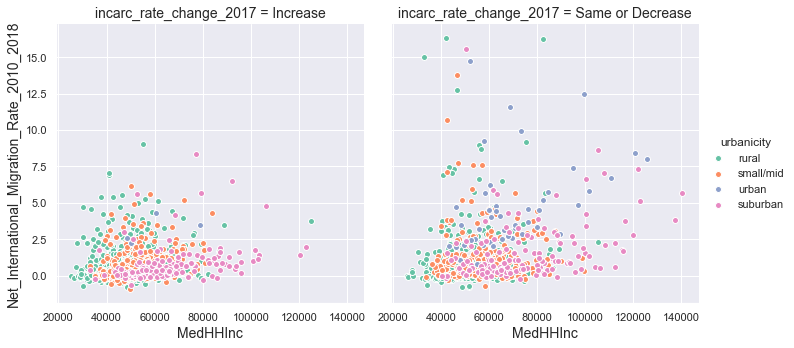

In [117]:
# scatter plot of median household income and net international migration rate, with urbanicity hue
g = sns.FacetGrid(feats_target, col="incarc_rate_change_2017", hue="urbanicity", height=5, aspect=1)
g = g.map(plt.scatter, "MedHHInc", "Net_International_Migration_Rate_2010_2018", edgecolor="w").add_legend()

The FacetGrids above help us see differences in the distributions and relationships between numerical variables split in a way that correspond to our target variable labels. For instance, in the first plot, we can see that the scatter plot between poverty and total jail population certainly appear to have a linear relationship, but remain with a much lower distribution when it comes to counties with increased incarceration rates. Also of note, our per capita income distribution has slightly greater variance and a longer right tail in counties with same or decreased incarceration rates, which suggests that in counties with higher income levels we're more likely to see steady or decreased rates. Finally, scatter plots of net international migration rates between 2010 and 2018 against median household income appear to only have a slightly upward trend, with plenty of variance. Urbanicity hues across both target var labels indicate that rural and small/mid sized counties tend to have lower median household incomes compared to urban and suburban counties. 

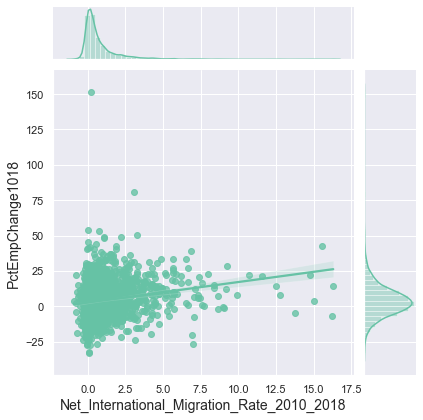

In [118]:
# plot net migration and percentage employment change from over 2010-2018
g = sns.jointplot(x="Net_International_Migration_Rate_2010_2018", y="PctEmpChange1018", 
                  data=num_feats_targ, kind='reg');

In the above, we can see a slight upward trend between net international migration rate and percentage employment change from 2010 to 2018.

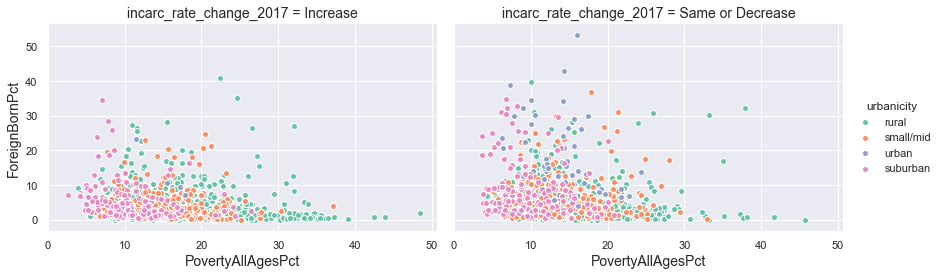

In [119]:
# scatter plot of percentage foreign born and percentage under the povery line, with urbanicity hue
g = sns.FacetGrid(feats_target, col="incarc_rate_change_2017", hue="urbanicity", height=4, aspect=1.5)
g = g.map(plt.scatter, "PovertyAllAgesPct", "ForeignBornPct", edgecolor="w").add_legend()

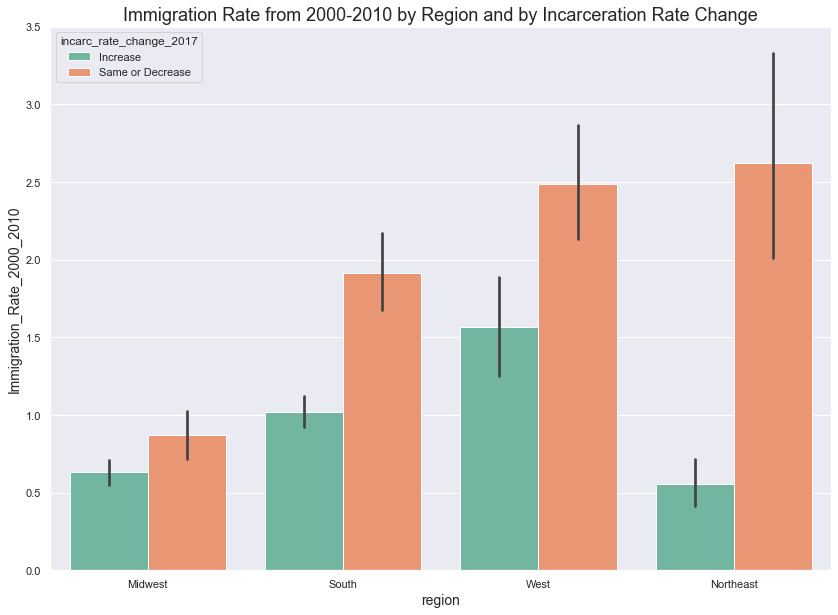

In [120]:
# bar plots of immigration rate (2000-2010) by region and incarceration rate change
sns.barplot( x="region", y="Immigration_Rate_2000_2010", hue="incarc_rate_change_2017", data=feats_target)
plt.title("Immigration Rate from 2000-2010 by Region and by Incarceration Rate Change", fontsize=18);

In the above, we can see that in all regions, counties with decreased/steady incarceration rates have higher immigration rates from 2000-2010 compared to counties with increased incarceration rates.

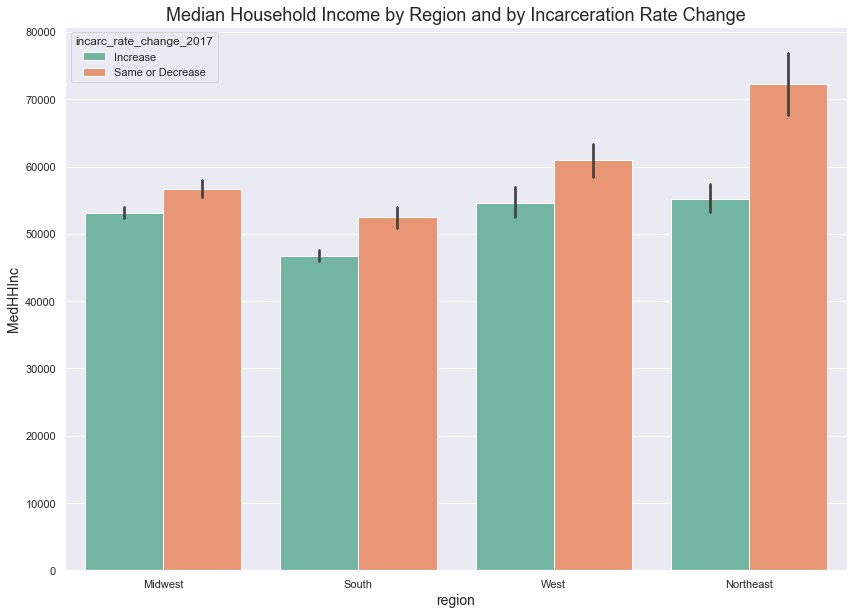

In [121]:
# barplot of median household income and 
sns.barplot( x="region", y="MedHHInc", hue="incarc_rate_change_2017", data=feats_target)
plt.title("Median Household Income by Region and by Incarceration Rate Change", fontsize=18);

In the above, we can see that in every region of the U.S., counties with increased incarceration rates tend to have lower median household incomes compared to counties with decreased/steady incarceration rates in those same regions.

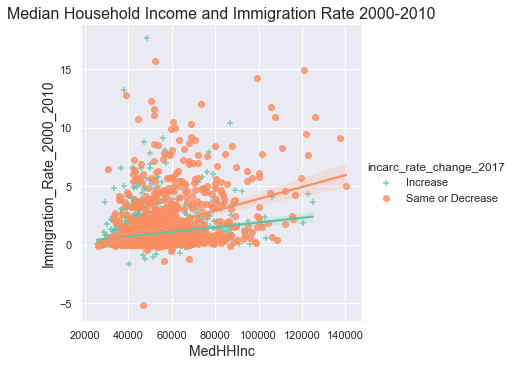

In [122]:
sns.lmplot(x="MedHHInc", y="Immigration_Rate_2000_2010", hue="incarc_rate_change_2017", markers=["+", "o"], 
           data=num_feats_targ, fit_reg=True)
plt.title("Median Household Income and Immigration Rate 2000-2010", fontsize=16);

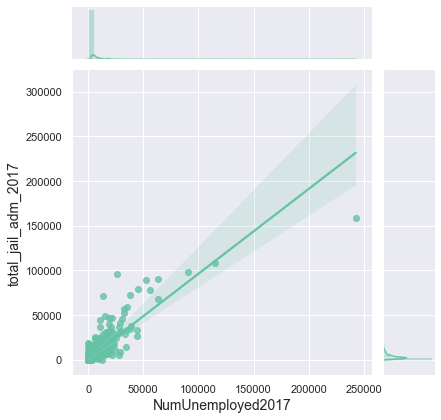

In [123]:
# jointplot of 2017 jail admissions and total number of unemployed persons
g = sns.jointplot(x="NumUnemployed2017", y="total_jail_adm_2017", 
                  data=num_feats_targ, kind='reg');

We can see a clear upward trend between number of unemployed persons and total jail admissions in 2017.

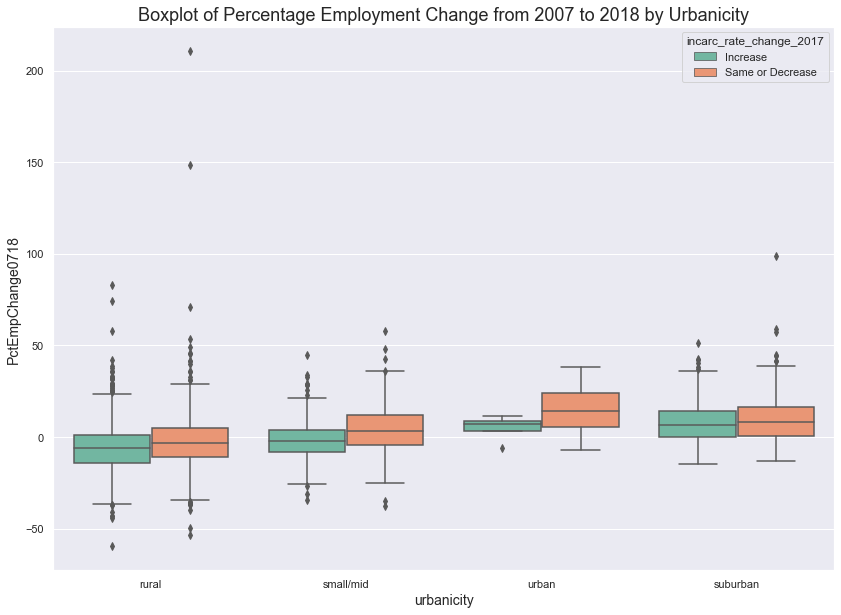

In [124]:
# boxplot of percentage change in employment from 2007-2018 by urbanicity and 2017 incarc rate change
sns.boxplot(x='urbanicity', y='PctEmpChange0718', hue="incarc_rate_change_2017", data=feats_target)
plt.title("Boxplot of Percentage Employment Change from 2007 to 2018 by Urbanicity", fontsize=18);

In the above boxplots by urbanicity label and target var labels, we can see that in all urbanicity levels, employment rate percentage changes are slightly lower for counties with increased incarceration rates, indicating a slower and or negative employment rate changes for counties with higher/increased incarceration rates. In other words, slower and reduced employment rate changes tend to occur in counties with increased incarceration rates. In fact, for rural and small/mid counties, those with increased incarceration rates especially show negative percentage employment change rates. Additionally, urban and suburban counties have relatively higher percentage employment changes from 2007 to 2018. This supports the observation in the earlier jointplot of their being an upward trend between unemployment and jail admissions.

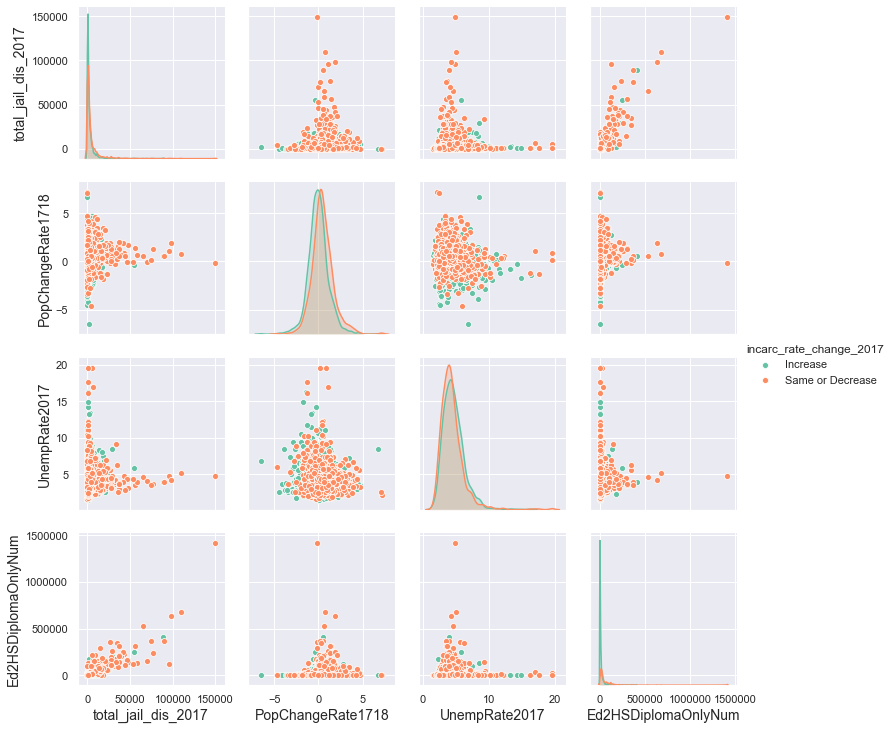

In [125]:
df = feats_target[['total_jail_dis_2017', 'PopChangeRate1718', 'UnempRate2017', 
                 'Ed2HSDiplomaOnlyNum', 'incarc_rate_change_2017']].copy()
g = sns.pairplot(df, hue="incarc_rate_change_2017");

### Final Transformations for Modeling
We will use pd.get_dummies with drop_first set to False, since we do not need to worry about the Dummy Variable Trap as multicollinearity is not an issue for the models we plan to employ. 

We will also drop the two variables that we used to determine the class labels - `total_jail_pop_rate_2017` and `incarc_rate_avg_2008_2016` since these alone would be able to perfectly predict our classes.

In [126]:
# Drop the two vars used for creating class labels
X_train = X_train.drop(['incarc_rate_avg_2008_2016', 'total_jail_pop_rate_2017'], axis=1)
X_test = X_test.drop(['incarc_rate_avg_2008_2016', 'total_jail_pop_rate_2017'], axis=1)

In [127]:
# Convert categorical data into dummies in train and test data
X_train = pd.get_dummies(X_train, prefix_sep="_", drop_first=False)
X_test = pd.get_dummies(X_test, prefix_sep="_", drop_first=False)

# replace target variable labels
y_train.replace({"Increase" : 1, "Same or Decrease" : 0}, inplace=True)
y_train.value_counts()

# replace target variable labels
y_test.replace({"Increase" : 1, "Same or Decrease" : 0}, inplace=True)
y_test.value_counts()

1    1518
0     964
Name: incarc_rate_change_2017, dtype: int64

1    375
0    246
Name: incarc_rate_change_2017, dtype: int64

In [128]:
# Confirm expected shapes of data
print("/n Training data shape of X and y: ")
X_train.shape
y_train.shape
print("Test data shape of X and y: ")
X_test.shape
y_test.shape

/n Training data shape of X and y: 


(2482, 698)

(2482,)

Test data shape of X and y: 


(621, 697)

(621,)

It appears that we are missing one column in the test set. This likely happened during the test_train_split stage, where one category is missing from the test set while it exists in the training set only.  We'll run through the column names to see what is missing in the test data.

In [129]:
# create lists of columns names from train and test data
train_cols = list(X_train.columns)
test_cols = list(X_test.columns)

# loop through col names to identify the discrepancy
for col in train_cols:
    if col not in test_cols:
        print(col)

state_DC


It appears that we're missing a column for `state_DC` in our test set. We'll add it to our test set, setting all values to 0.

In [130]:
# Add column for state_DC to test data
X_test['state_DC'] = 0
X_test.state_DC = X_test.state_DC.astype('uint8')
X_test.state_DC.dtype

dtype('uint8')

In [131]:
# Confirm expected shapes of data
print("/n Training data shape of X and y: ")
X_train.shape
y_train.shape
print("Test data shape of X and y: ")
X_test.shape
y_test.shape

/n Training data shape of X and y: 


(2482, 698)

(2482,)

Test data shape of X and y: 


(621, 698)

(621,)

Now let's repeat these steps for our 2nd version of the data - county-level data without incarceration data.

In [132]:
# Drop the two vars used for creating class labels
X2_train = X2_train.drop('incarc_rate_avg_2008_2016', axis=1)
X2_test = X2_test.drop('incarc_rate_avg_2008_2016', axis=1)

# Convert categorical data into dummies in train and test data
X2_train = pd.get_dummies(X2_train, prefix_sep="_", drop_first=False)
X2_test = pd.get_dummies(X2_test, prefix_sep="_", drop_first=False)

# replace target variable labels
y2_train.replace({"Increase" : 1, "Same or Decrease" : 0}, inplace=True)
y2_train.value_counts()

# replace target variable labels
y2_test.replace({"Increase" : 1, "Same or Decrease" : 0}, inplace=True)
y2_test.value_counts()

# Confirm expected shapes of data
print("/n Training data shape of X and y (without incarceration data): ")
X2_train.shape
y2_train.shape
print("Test data shape of X and y (without incarceration data): ")
X2_test.shape
y2_test.shape

1    1518
0     964
Name: incarc_rate_change_2017, dtype: int64

1    375
0    246
Name: incarc_rate_change_2017, dtype: int64

/n Training data shape of X and y (without incarceration data): 


(2482, 349)

(2482,)

Test data shape of X and y (without incarceration data): 


(621, 348)

(621,)

In [133]:
# create lists of columns names from train and test data
train_cols = list(X2_train.columns)
test_cols = list(X2_test.columns)

# loop through col names to identify the discrepancy
for col in train_cols:
    if col not in test_cols:
        print(col)

state_DC


In [134]:
# Add column for state_DC to test data
X2_test['state_DC'] = 0
X2_test.state_DC = X2_test.state_DC.astype('uint8')
X2_test.state_DC.dtype

dtype('uint8')

In [135]:
# Confirm expected shapes of data
print("/n Training data shape of X and y: ")
X2_train.shape
y2_train.shape
print("Test data shape of X and y: ")
X2_test.shape
y2_test.shape

/n Training data shape of X and y: 


(2482, 349)

(2482,)

Test data shape of X and y: 


(621, 349)

(621,)

**Summary of *EXPLORE* step:** 
- We explored and visualized the data in a copy of our training data, including looking at variables related to immigration, employment, and locality.
- We converted our categorical variables to dummies.
- We left our numerical data as is because it does not need to be scaled for non-parametric modeling.
- We made the same transformations (dummies) to our test data.

## **Model**

### Modeling Approach

#### Model Selection - Non-parametric, tree-based models  
As previously mentioned, we will stick with tree based and non-parametric models due to the high level of correlation in our features. Whereas parametric machine learning algorithms simplify the function to a known form, often with an assumed linear combination for the functional form and relying upon some fundamental assumptions, non-parametric algorithms do not make the same kinds of strong assumptions about the form of the function. Instead, they seek to best fit the underlying training data while still maintaining the ability to generalize to unseen data. Non-parametric models are flexible and powerful, but they require more training data and can be prone to overfitting. 

Another key element in choosing the models is the importance of interpretability for this project. Decision trees and Random Forest Classifier are highly interpretable when compared to more complex models, in fact the decisions can be visualized and easily explained.

The models we will use include:
- **Decision Tree Classifier**
- **Random Forest Classifier** 
- **Extra Trees Classifier** 
- **AdaBoost Classifier**

**Hyperparameter Tuning and Pruning**
After generating a baseline model, we will tune hyperparameters using GridSearchCV to adjust hyperparameters, which can help mitigate overfitting.

#### Feature Importance & Interpretability
We will look at the Feature Importances of our tree-based models, but need to take into consideration that they can have unexpected behavior surrounding highly correlated features, regardless of how important those features are to the performance of the model. For instance, if two features are highly correlated, both of their scores will decrease in the feature importances. We'll choose our best performing model and examine feature importance, which Scikit-Learn measures by looking at how much the tree nodes that use that feature reduce impurity on average (across all trees in the forest). It's a weighted average, where each node's weight is equal to the number of training samples that are associated with it. The score for each feature is scaled so that the the sum of all importances is equal to 1.

#### Performance Measures 

**Accuracy** is not generally the most appropriate performance measure for classification tasks. In order to evaluate the performance of our classifiers, we will use **confusion matrices** and the **F1 score**, which is a score that tends to favor classifiers with similar precision and recall. The F1 score, which is the harmonic mean of precision and recall, will be used to compare across the various models we deploy. 


**Planned tasks:**

1. Build baseline model.
2. Build and tune models - Decision Tree, SVM, and Random Forest.
3. Use GridSearchCV for tuning hyperparameters.
4. Build a pipeline for final, selected model.

### **Models *with* Incarceration Data**

#### Decision Tree Classifier - Baseline Model

In [169]:
# Instantiate model
clf_bl = DecisionTreeClassifier(random_state=42)

# Fit model to training data
clf_bl.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

In [170]:
# Create DOT Data
dot_data = export_graphviz(clf_bl, out_file=None, 
               feature_names=X_train.columns, 
               class_names=np.unique(y_train).astype('str'), rounded=True, filled=True, 
               special_characters=True)

# Draw the graph
graph = graph_from_dot_data(dot_data)

# Show Graph
Image(graph.create_png())

In [177]:
# Use cross_val_score to evaluate the model on the training data
clf_bl_f1_tr = cross_val_score(clf_bl, X_train, y_train, cv=3, scoring="f1").mean()
clf_bl_f1_tr

0.7856866761145831

With cross validation across 3 folds, we achieved F1 scores of over 78.6% on our training data. Effectively, we've split the training set into 3 folds then made predictions and evaluated them on each fold using a model trained on the remaining folds. We'll go ahead and apply our model to the test data and then examine a few evaluation metrics.

In [178]:
# Predict on test data
clf_bl_preds = clf_bl.predict(X_test)

In [180]:
# Produce the F1 score and Classification Report
clf_bl_f1 = f1_score(y_test, clf_bl_preds)
print("Baseline Decision Classifier: F1 score on Test set: {}".format(clf_bl_f1))
print('\n')
print(classification_report(y_test, clf_bl_preds))


Baseline Decision Classifier: F1 score on Test set: 0.7824933687002652


              precision    recall  f1-score   support

           0       0.67      0.66      0.66       246
           1       0.78      0.79      0.78       375

    accuracy                           0.74       621
   macro avg       0.72      0.72      0.72       621
weighted avg       0.74      0.74      0.74       621



On the test data, similar to our cross_val_score on the training data, we're achieving an F1 score of approximately 78%.

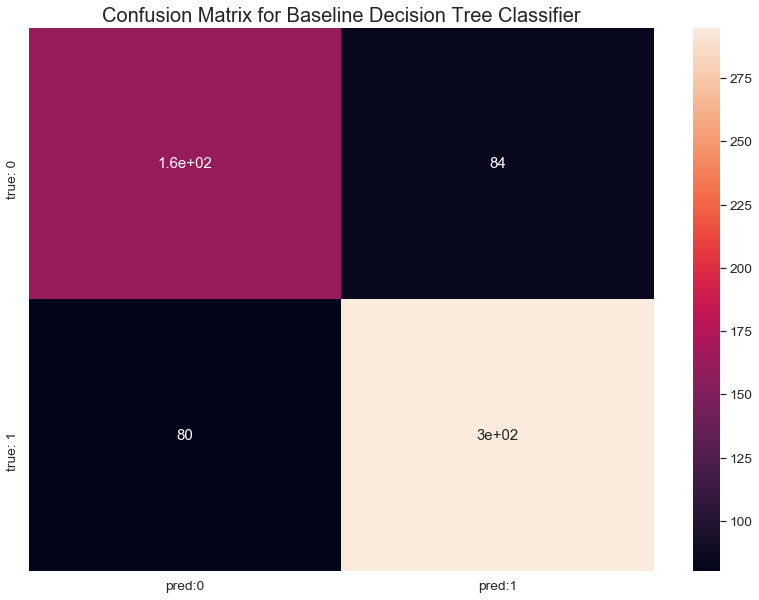

In [181]:
unique_label = np.unique([y_test, clf_bl_preds])

#ax = plt.subplot()
cmtx = pd.DataFrame(confusion_matrix(y_test, clf_bl_preds, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for Baseline Decision Tree Classifier", fontsize=20);

In the above confusion matrix, our basic Decision Tree Classifier performed relatively well - predicting our true negatives (Same or Decrease) correctly for 160 of the cases and accurately predicting the true positives (Increase) for 300 cases.

In [183]:
# look at a sorted list of feature importance scores
clf_bl_feat_import = sorted(zip(map(lambda x: round(x, 4), clf_bl.feature_importances_), 
                 X_test.columns), reverse=True)

# Print top 50
clf_bl_feat_import[:50]

[(0.1281, 'total_jail_pop_rate_2016'),
 (0.1071, 'total_jail_pop_rate_2008'),
 (0.0564, 'total_jail_pop_2010'),
 (0.0518, 'total_jail_from_other_fed_2008'),
 (0.039, 'total_jail_pop_rate_2015'),
 (0.0369, 'PopChangeRate1018'),
 (0.0345, 'total_jail_pop_rate_2009'),
 (0.0265, 'total_jail_pop_rate_2010'),
 (0.0248, 'total_jail_from_other_jail_2013'),
 (0.0228, 'male_jail_pop_rate_2009'),
 (0.0181, 'male_jail_pop_rate_2008'),
 (0.0137, 'PctEmpFIRE'),
 (0.011, 'total_jail_pop_rate_2013'),
 (0.0106, 'latinx_jail_pop_2016'),
 (0.01, 'black_jail_pop_rate_2011'),
 (0.0095, 'ForeignBornCaribPct'),
 (0.0094, 'Ed2HSDiplomaOnlyPct'),
 (0.0091, 'total_jail_pop_rate_2014'),
 (0.0086, 'total_jail_from_prison_2011'),
 (0.0086, 'PovertyAllAgesNum'),
 (0.0085, 'total_jail_from_prison_2016'),
 (0.0071, 'white_jail_pop_2016'),
 (0.0071, 'VietnamEraVetsPct'),
 (0.007, 'PctEmpMining'),
 (0.0069, 'total_jail_pretrial_rate_2008'),
 (0.0067, 'total_jail_from_other_jail_2016'),
 (0.0062, 'PctEmpTrade'),
 (0.006

#### Random Forest Classifier

Random Forests tend to perform better on noisy datasets, and as an ensemble method, variance is considered a good thing amongst our trees. In fact, if we can achieve high diversity among the trees in our forest, then our model will be more resilient to noise and less prone to overfitting.

In [142]:
RandomForestClassifier().get_params().keys()

dict_keys(['bootstrap', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

Perhaps one of the most important hyperparameters for Random Forests are the number of random features to sample at each split point (max_features) and the number of trees (n_estimators).

In [143]:
rf_clf = RandomForestClassifier(random_state=42)

# Make a param grid for the model
rf_param_grid = {
    'max_features':['sqrt', 'log2'], 
    'n_estimators':[10,100,1000],
    'criterion':['gini', 'entropy']
}


# Construct a grid search
rf_gs = GridSearchCV(rf_clf, rf_param_grid, cv=3, scoring="f1")

# Fit to training data
rf_gs.fit(X_train, y_train)

# Print training accuracy and best parameters
print("Best Training F1 Score: {}".format(rf_gs.best_score_))
print("Best Params: {}".format(rf_gs.best_params_))

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'

Best Training F1 Score: 0.8204492290448034
Best Params: {'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 1000}


In [144]:
# run the model on the test set
rf_gs_pred = rf_gs.predict(X_test)

# Produce the F1 score
rf_gs_f1 = f1_score(y_test, rf_gs_pred)
print("Random Forest Classifier: F1 score on Test set: {}".format(rf_gs_f1))
print(classification_report(y_test, rf_gs_pred))

Random Forest Classifier: F1 score on Test set: 0.8104265402843602
              precision    recall  f1-score   support

           0       0.78      0.48      0.60       246
           1       0.73      0.91      0.81       375

    accuracy                           0.74       621
   macro avg       0.76      0.70      0.70       621
weighted avg       0.75      0.74      0.73       621



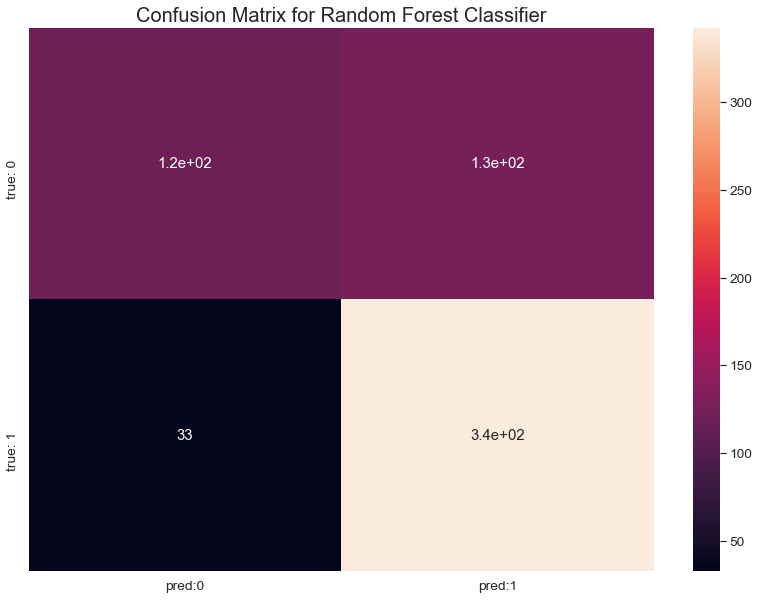

In [145]:
# Build confusion matrix
unique_label = np.unique([y_test, rf_gs_pred])

#ax = plt.subplot()
cmtx = pd.DataFrame(confusion_matrix(y_test, rf_gs_pred, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for Random Forest Classifier", fontsize=20);

While are F1 score is 81% on our test data, we can see that recall is low for accurately predicting the counties with Same or Decreased incarceration rates (class label 0). For counties with Same or Decreased rates, we have almost as many correctly classified as were incorrectly classified, whereas the model did much better at correctly classifying counties with increased incarceration rates.

In [184]:
rf_best = rf_gs.best_estimator_

# look at a sorted list of feature importance scores
rf_feat_import = sorted(zip(map(lambda x: round(x, 4), rf_best.feature_importances_), 
                 X_test.columns), reverse=True)

# Print top 50
rf_feat_import[:50]

[(0.0114, 'total_jail_pop_rate_2016'),
 (0.0093, 'total_jail_pop_rate_2015'),
 (0.0081, 'total_jail_pop_rate_2008'),
 (0.0076, 'total_jail_pop_rate_2014'),
 (0.0061, 'PopChangeRate1018'),
 (0.006, 'total_jail_pop_rate_2009'),
 (0.006, 'male_jail_pop_rate_2008'),
 (0.0059, 'total_jail_pop_rate_2013'),
 (0.0058, 'PopChangeRate1718'),
 (0.0054, 'white_jail_pop_rate_2017'),
 (0.0054, 'male_jail_pop_rate_2009'),
 (0.0054, 'PctNonVetsDisabilty'),
 (0.0051, 'white_jail_pop_rate_2016'),
 (0.0048, 'male_jail_pop_rate_2010'),
 (0.0043, 'male_jail_pop_rate_2011'),
 (0.0041, 'total_jail_pretrial_rate_2017'),
 (0.0041, 'total_jail_pop_rate_2010'),
 (0.0039, 'total_jail_pretrial_rate_2016'),
 (0.0039, 'NaturalChangeRate0010'),
 (0.0038, 'white_jail_pop_rate_2015'),
 (0.0038, 'male_jail_pop_rate_2012'),
 (0.0037, 'white_jail_pop_rate_2008'),
 (0.0037, 'total_jail_pop_rate_2012'),
 (0.0037, 'total_jail_pop_2008'),
 (0.0036, 'latinx_jail_pop_2008'),
 (0.0036, 'NetMigration1018'),
 (0.0035, 'white_jail_

#### Extra Trees Classifier

With Random Forest, at each node a random subset of the features is utilized for splitting, but with Extra (Extremely Randomized) Trees we can introduce even more variation and randomness by also using a random threshold for each feature rather than searching for the best possible thresholds, which is what our baseline Decision Tree did. Just as with Random Forest, this technique trades more bias for a lower variance. It also is much faster than Random Forests because it doesn't need to find the optimal threshold foe each feature at every node, which in general is one of the most time-consuming tasks when growing a tree as with Random Forest.

We'll use Scikit-Learn's ExtraTreesClassifier.

In [146]:
# Look at parameters for this algorithm
ExtraTreesClassifier().get_params().keys()

dict_keys(['bootstrap', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [147]:
# Construct the pipeline
et_pipe = Pipeline([('et', ExtraTreesClassifier(random_state=42))])

# Set Grid Search Params
et_param_grid = {
    'et__criterion':['gini', 'entropy'], 
    'et__max_depth':[None, 2, 6, 10], 
    'et__min_samples_split':[5, 10], 
    'et__min_samples_leaf':[3, 6], 
    'et__n_estimators':[10, 100, 1000], 
}

# Construct grid search
et_gs = GridSearchCV(estimator=et_pipe, 
                    param_grid=et_param_grid, 
                    scoring='f1', 
                    cv=3, return_train_score=True)

# Fit using gridsearch
et_gs.fit(X_train, y_train)

# Print best f1 score
print('Best f1 score: %.3f'%et_gs.best_score_)

# Print best parameters
print('\nBest Params:\n', et_gs.best_params_)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('et',
                                        ExtraTreesClassifier(bootstrap=False,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=2,
                                          

Best f1 score: 0.805

Best Params:
 {'et__criterion': 'entropy', 'et__max_depth': None, 'et__min_samples_leaf': 3, 'et__min_samples_split': 5, 'et__n_estimators': 1000}


In [148]:
# Predict on test set
et_gs_pred = et_gs.predict(X_test)

# Generate metrics for model performance
et_gs_f1_score = f1_score(y_test, et_gs_pred)
print("Extra Trees Classifier: F1 score on Test Set: {}".format(et_gs_f1_score))
print("--------------------------------------------------")
print(classification_report(y_test, et_gs_pred))

Extra Trees Classifier: F1 score on Test Set: 0.7914317925591883
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.78      0.35      0.48       246
           1       0.69      0.94      0.79       375

    accuracy                           0.70       621
   macro avg       0.73      0.64      0.64       621
weighted avg       0.72      0.70      0.67       621



The Extra Trees classifier did not perform very well with predicting the 0.0 (Same or Decrease) class in our test data, with a recall score of 35% and a 48% f1 score for this label. 

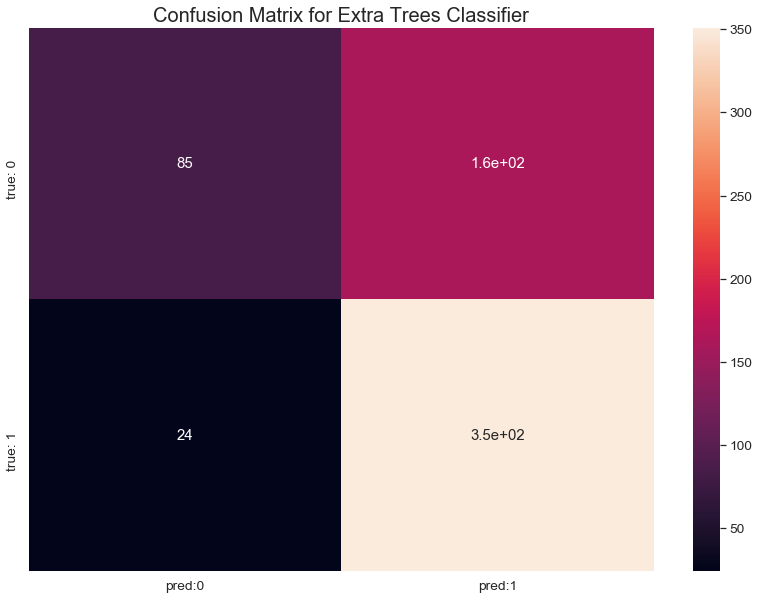

In [149]:
# Build Confusion Matrix
unique_label = np.unique([y_test, et_gs_pred])

#ax = plt.subplot()
cmtx = pd.DataFrame(confusion_matrix(y_test, et_gs_pred, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for Extra Trees Classifier", fontsize=20);

#### AdaBoost Classifier

AdaBoost works by training a base classifier and using it to make predictions on the training set, then increasing the relative weight of misclassified training instances. It then trains a second classifier, using the updated weights, and again makes predictions on the training set, updating the instance weights, etc. In effect, the predictor corrects its predecessor by paying more attention to the training instances that the predecessor underfitted, which results in a new predictor that focuses more and more on the hard cases.

This sequential learning technique is similar to Gradient Descent, except that instead to tweaking a single predictor's parameters to minimize a cost function, AdaBoost adds predictors to the ensemble, which gradually improves its performance. Once all predictors have been trained, the ensemble makes predictions based on the predictors having different weights depending on their overall accuracy on the weighted training data.

In [150]:
AdaBoostClassifier().get_params().keys()

dict_keys(['algorithm', 'base_estimator', 'learning_rate', 'n_estimators', 'random_state'])

In [151]:
# Construct the pipeline
ab_pipe = Pipeline([('ab', AdaBoostClassifier(random_state=42))])

# Set Grid Search Params
ab_param_grid = {
    'ab__n_estimators':[10,100,500,1000], 
    'ab__learning_rate':[1.0, 0.5, 0.1]
}

# Construct grid search
ab_gs = GridSearchCV(estimator=ab_pipe, 
                    param_grid=ab_param_grid, 
                    scoring='f1', 
                    cv=3, return_train_score=True)

# Fit using gridsearch
ab_gs.fit(X_train, y_train)

# Print best f1 score
print('Best f1 score: %.3f'%ab_gs.best_score_)

# Print best parameters
print('\nBest Params:\n', ab_gs.best_params_)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('ab',
                                        AdaBoostClassifier(algorithm='SAMME.R',
                                                           base_estimator=None,
                                                           learning_rate=1.0,
                                                           n_estimators=50,
                                                           random_state=42))],
                                verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'ab__learning_rate': [1.0, 0.5, 0.1],
                         'ab__n_estimators': [10, 100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='f1', verbose=0)

Best f1 score: 0.864

Best Params:
 {'ab__learning_rate': 0.1, 'ab__n_estimators': 1000}


In [152]:
# Predict on Test Set
ab_gs_pred = ab_gs.predict(X_test)

# Generate metrics for model performance
ab_gs_f1_score = f1_score(y_test, ab_gs_pred)
print("AdaBoost Classifier: F1 score on Test Set: {}".format(ab_gs_f1_score))
print("--------------------------------------------------")
print(classification_report(y_test, ab_gs_pred))

AdaBoost Classifier: F1 score on Test Set: 0.8655569782330346
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.72      0.77       246
           1       0.83      0.90      0.87       375

    accuracy                           0.83       621
   macro avg       0.83      0.81      0.82       621
weighted avg       0.83      0.83      0.83       621



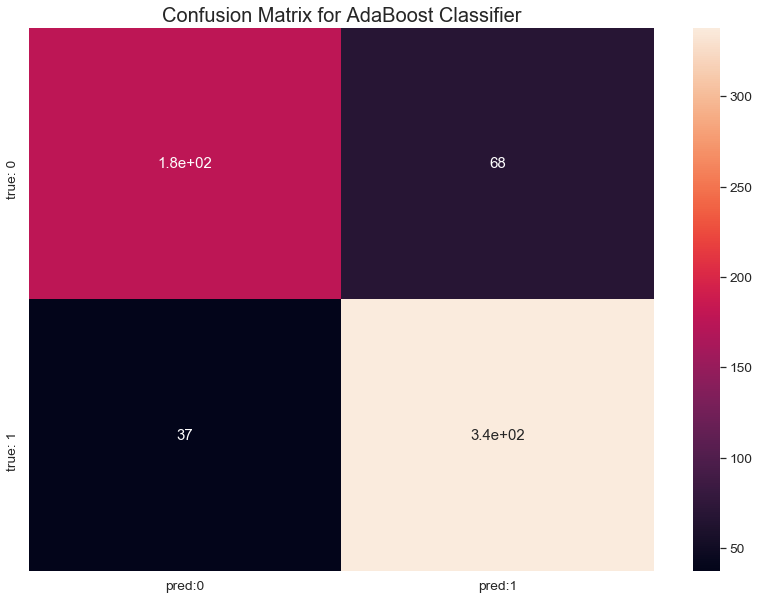

In [153]:
# Build confusion matrix
unique_label = np.unique([y_test, ab_gs_pred])

cmtx = pd.DataFrame(confusion_matrix(y_test, ab_gs_pred, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for AdaBoost Classifier", fontsize=20);

### **Models *without* Incarceration Data**

We are going to implement the same algorithms on the version of the data that has incarceration-related features removed. Since this greatly reduces the dimensionality of our data, we will examine and plot feature importance after each model.

#### Decision Tree Classifier - Baseline Model

In [199]:
# Instantiate model
clf_bl2 = DecisionTreeClassifier(random_state=42)

# Fit model to training data
clf_bl2.fit(X2_train, y2_train)

# Use cross_val_score to evaluate the model on the training data
clf_bl2_f1_tr = cross_val_score(clf_bl2, X2_train, y2_train, cv=3, scoring="f1").mean()
print("Training F1 Score: {}".format(clf_bl2_f1_tr))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=42, splitter='best')

Training F1 Score: 0.6481692946796995


In [200]:
# Create DOT Data
dot_data = export_graphviz(clf_bl2, out_file=None, 
               feature_names=X2_train.columns, 
               class_names=np.unique(y2_train).astype('str'), rounded=True, filled=True, 
               special_characters=True)

# Draw the graph
graph = graph_from_dot_data(dot_data)

# Show Graph
Image(graph.create_png())

Decision Tree Classifier: F1 score on Test Set: 0.5545454545454545
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.43      0.59      0.49       246
           1       0.64      0.49      0.55       375

    accuracy                           0.53       621
   macro avg       0.54      0.54      0.52       621
weighted avg       0.56      0.53      0.53       621



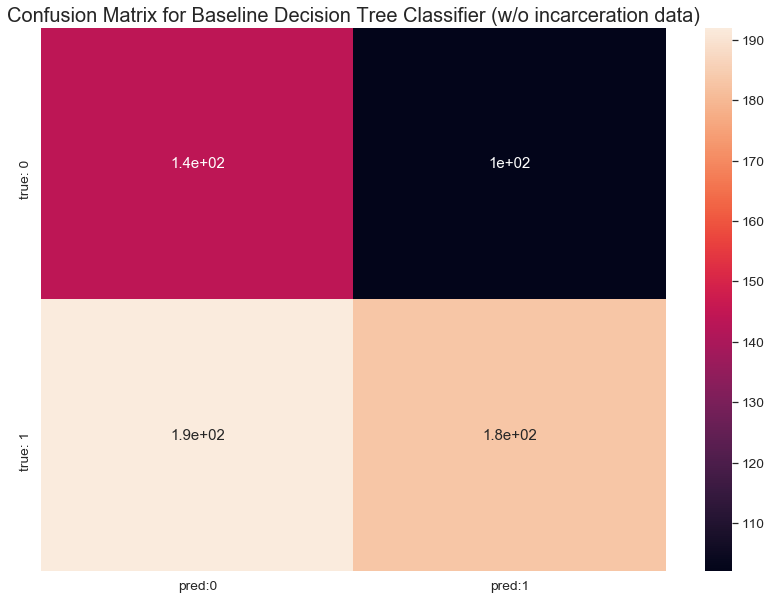

In [201]:
# Predict on test data
clf_bl2_preds = clf_bl2.predict(X2_test)

# Look at classification report
clf_bl2_preds_f1_score = f1_score(y2_test, clf_bl2_preds)
print("Decision Tree Classifier: F1 score on Test Set: {}".format(clf_bl2_preds_f1_score))
print("--------------------------------------------------")
print(classification_report(y2_test, clf_bl2_preds))

# Build Confusion Matrix
unique_label = np.unique([y2_test, clf_bl2_preds])

#ax = plt.subplot()
cmtx = pd.DataFrame(confusion_matrix(y2_test, clf_bl2_preds, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for Baseline Decision Tree Classifier (w/o incarceration data)", fontsize=20);

In [202]:
# look at a sorted list of feature importance scores
clf_bl2_feat_import = sorted(zip(map(lambda x: round(x, 4), clf_bl2.feature_importances_), 
                 X2_train.columns), reverse=True)

# Print top 50
clf_bl2_feat_import[:50]

[(0.0655, 'PopChangeRate1018'),
 (0.0308, 'NonEnglishHHPct'),
 (0.0287, 'MedianNonVetsInc'),
 (0.0265, 'PctNonVetsDisabilty'),
 (0.0241, 'FemaleHHPct'),
 (0.0239, 'PopChangeRate1718'),
 (0.0184, 'LessThanHSVetsPct'),
 (0.018, 'GulfWar1VetsPct'),
 (0.0176, 'MedHHInc'),
 (0.0171, 'PctEmpTrade'),
 (0.0169, 'OwnHomePct'),
 (0.0157, 'PctEmpInformation'),
 (0.0151, 'Age65AndOlderPct2010'),
 (0.0149, 'Ed4AssocDegreePct'),
 (0.0145, 'PctVetsPoor'),
 (0.0133, 'ForeignBornAfricaPct'),
 (0.0131, 'BlackNonHispanicPct2010'),
 (0.0128, 'NonHispanicAsianPopChangeRate0010'),
 (0.0126, 'PovertyUnder18Pct'),
 (0.0122, 'Net_International_Migration_Rate_2010_2018'),
 (0.0122, 'FemaleVetsPct'),
 (0.0121, 'NaturalChangeRate1018'),
 (0.0119, 'PctEmpTrans'),
 (0.0117, 'NonHispanicNativeAmericanPopChangeRate0010'),
 (0.0114, 'NonEnglishHHNum'),
 (0.0107, 'Age65AndOlderNum2010'),
 (0.0106, 'WW2VetsPct'),
 (0.0106, 'MultipleRacePct2010'),
 (0.0104, 'black_pop_15to64_2014'),
 (0.0101, 'KoreanWarVetsPct'),
 (0.009

#### Random Forest Classifier

In [160]:
rf2_clf = RandomForestClassifier(random_state=42)

# Make a param grid for the model
rf2_param_grid = {
    'max_features':['sqrt', 'log2'], 
    'n_estimators':[10,100,500,1000],
    'criterion':['gini', 'entropy']
}

# Construct a grid search
rf2_gs = GridSearchCV(estimator=rf2_clf, 
                      param_grid=rf2_param_grid, 
                      cv=3, scoring="f1", return_train_score=True)

# Fit to training data
rf2_gs.fit(X2_train, y2_train)

# Print training accuracy and best parameters
print("Best Training F1 Score: {}".format(rf2_gs.best_score_))
print("Best Params: {}".format(rf2_gs.best_params_))

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=42,
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'

Best Training F1 Score: 0.7655763162602993
Best Params: {'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 1000}


Random Forest Classifier: F1 score on Test set: 0.7580645161290321
              precision    recall  f1-score   support

           0       0.64      0.33      0.44       246
           1       0.67      0.88      0.76       375

    accuracy                           0.66       621
   macro avg       0.65      0.61      0.60       621
weighted avg       0.66      0.66      0.63       621



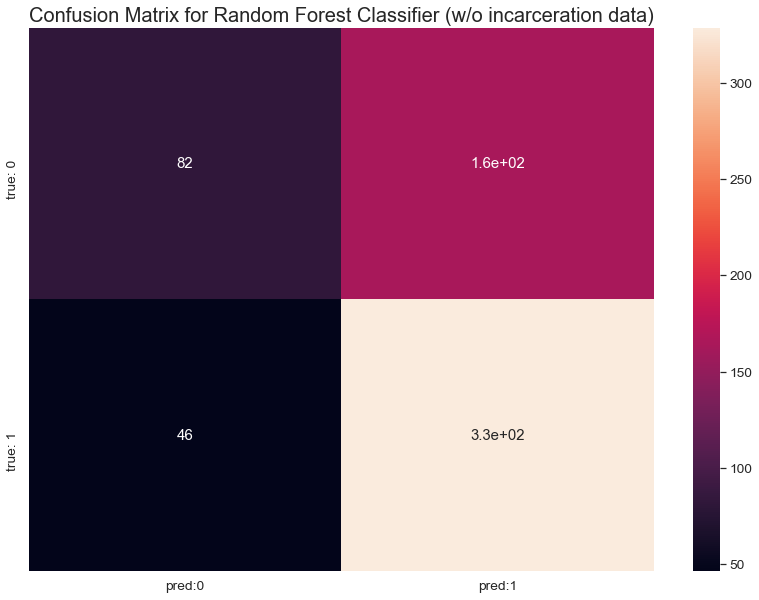

In [161]:
# run the model on the test set
rf2_gs_pred = rf2_gs.predict(X2_test)

# Produce the weighted F1 score
rf2_gs_f1 = f1_score(y2_test, rf2_gs_pred)
print("Random Forest Classifier: F1 score on Test set: {}".format(rf2_gs_f1))
print(classification_report(y2_test, rf2_gs_pred))

# Build confusion matrix
unique_label = np.unique([y2_test, rf2_gs_pred])

cmtx = pd.DataFrame(confusion_matrix(y2_test, rf2_gs_pred, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for Random Forest Classifier (w/o incarceration data)", fontsize=20);

In [195]:
rf2_best = rf2_gs.best_estimator_

# look at a sorted list of feature importance scores
rf2_feat_import = sorted(zip(map(lambda x: round(x, 4), rf2_best.feature_importances_), 
                 X2_test.columns), reverse=True)

# Print top 50
rf2_feat_import[:50]

[(0.0105, 'PctNonVetsDisabilty'),
 (0.0099, 'PopChangeRate1018'),
 (0.0096, 'PopChangeRate1718'),
 (0.0076, 'NaturalChangeRate0010'),
 (0.0074, 'NaturalChangeRate1018'),
 (0.0068, 'MedHHInc'),
 (0.0065, 'Age65AndOlderPct2010'),
 (0.0064, 'PctEmpChange1718'),
 (0.0064, 'NaturalChange1018'),
 (0.0063, 'PctEmpChange0718'),
 (0.0063, 'FemaleHHPct'),
 (0.0062, 'NetMigration1018'),
 (0.006, 'Under18Pct2010'),
 (0.006, 'Immigration_Rate_2000_2010'),
 (0.006, 'Ed2HSDiplomaOnlyPct'),
 (0.006, 'AvgHHSize'),
 (0.0059, 'PctEmpTrans'),
 (0.0059, 'NetMigrationRate1018'),
 (0.0059, 'MedianVetsInc'),
 (0.0059, 'MedianNonVetsInc'),
 (0.0059, 'CollegeDegreeVetsPct'),
 (0.0058, 'PctEmpTrade'),
 (0.0058, 'PctEmpMining'),
 (0.0058, 'PctEmpInformation'),
 (0.0058, 'PctEmpAgriculture'),
 (0.0058, 'GulfWar1VetsPct'),
 (0.0057, 'PovertyAllAgesPct'),
 (0.0057, 'PopChangeRate0010'),
 (0.0056, 'WW2VetsPct'),
 (0.0056, 'PctVetsDisabilty'),
 (0.0056, 'PctEmpFIRE'),
 (0.0056, 'PctEmpChange0710'),
 (0.0056, 'Net_Inte

#### Extra Trees Classifier

In [163]:
# Construct the pipeline
et2_pipe = Pipeline([('et2', ExtraTreesClassifier(random_state=42))])

# Set Grid Search Params
et2_param_grid = {
    'et2__criterion':['gini', 'entropy'], 
    'et2__max_depth':[None, 2, 6, 10], 
    'et2__min_samples_split':[5, 10], 
    'et2__min_samples_leaf':[3, 6], 
    'et2__n_estimators':[10, 100, 1000], 
}

# Construct grid search
et2_gs = GridSearchCV(estimator=et2_pipe, 
                    param_grid=et2_param_grid, 
                    scoring='f1', 
                    cv=3, return_train_score=True)

# Fit using gridsearch
et2_gs.fit(X2_train, y2_train)

# Print best f1 score
print('Best f1 score: %.3f'%et2_gs.best_score_)

# Print best parameters
print('\nBest Params:\n', et2_gs.best_params_)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('et2',
                                        ExtraTreesClassifier(bootstrap=False,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=2,
                                         

Best f1 score: 0.774

Best Params:
 {'et2__criterion': 'entropy', 'et2__max_depth': 10, 'et2__min_samples_leaf': 3, 'et2__min_samples_split': 10, 'et2__n_estimators': 1000}


Extra Trees Classifier: F1 score on Test Set: 0.7576419213973798
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.65      0.21      0.32       246
           1       0.64      0.93      0.76       375

    accuracy                           0.64       621
   macro avg       0.65      0.57      0.54       621
weighted avg       0.64      0.64      0.58       621



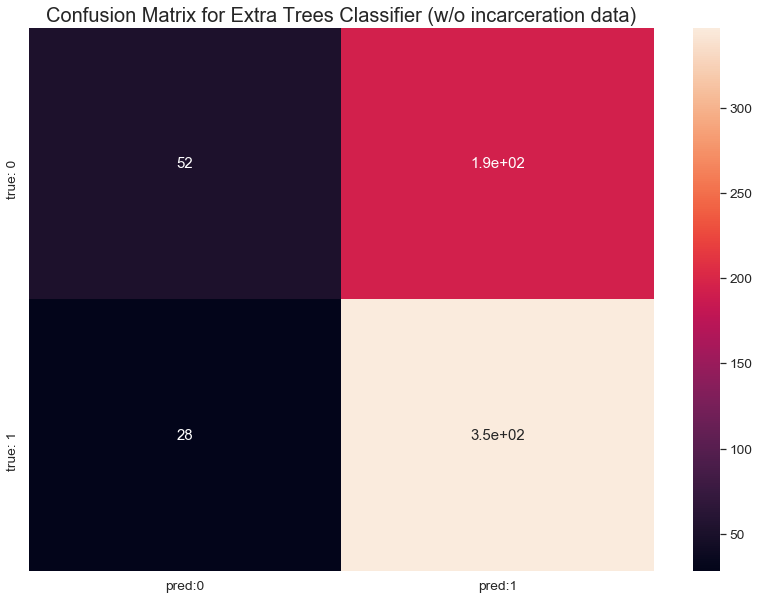

In [164]:
# Predict on test set
et2_gs_pred = et2_gs.predict(X2_test)

# Generate metrics for model performance
et2_gs_f1_score = f1_score(y2_test, et2_gs_pred)
print("Extra Trees Classifier: F1 score on Test Set: {}".format(et2_gs_f1_score))
print("--------------------------------------------------")
print(classification_report(y2_test, et2_gs_pred))

# Build Confusion Matrix
unique_label = np.unique([y2_test, et2_gs_pred])

#ax = plt.subplot()
cmtx = pd.DataFrame(confusion_matrix(y2_test, et2_gs_pred, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for Extra Trees Classifier (w/o incarceration data)", fontsize=20);

#### AdaBoost Classifier

In [189]:
# Construct the pipeline
ab2_pipe = Pipeline([('ab2', AdaBoostClassifier(random_state=42))])

# Set Grid Search Params
ab2_param_grid = {
    'ab2__n_estimators':[10,100,500,1000], 
    'ab2__learning_rate':[1.0, 0.5, 0.1]
}

# Construct grid search
ab2_gs = GridSearchCV(estimator=ab2_pipe, 
                    param_grid=ab2_param_grid, 
                    scoring='f1', 
                    cv=3, return_train_score=True)

# Fit using gridsearch
ab2_gs.fit(X2_train, y2_train)

# Print best f1 score
print('Best f1 score: %.3f'%ab2_gs.best_score_)

# Print best parameters
print('\nBest Params:\n', ab2_gs.best_params_)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('ab2',
                                        AdaBoostClassifier(algorithm='SAMME.R',
                                                           base_estimator=None,
                                                           learning_rate=1.0,
                                                           n_estimators=50,
                                                           random_state=42))],
                                verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'ab2__learning_rate': [1.0, 0.5, 0.1],
                         'ab2__n_estimators': [10, 100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='f1', verbose=0)

Best f1 score: 0.769

Best Params:
 {'ab2__learning_rate': 0.1, 'ab2__n_estimators': 100}


AdaBoost Classifier: F1 score on Test Set: 0.7590759075907592
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.66      0.23      0.34       246
           1       0.65      0.92      0.76       375

    accuracy                           0.65       621
   macro avg       0.65      0.58      0.55       621
weighted avg       0.65      0.65      0.59       621



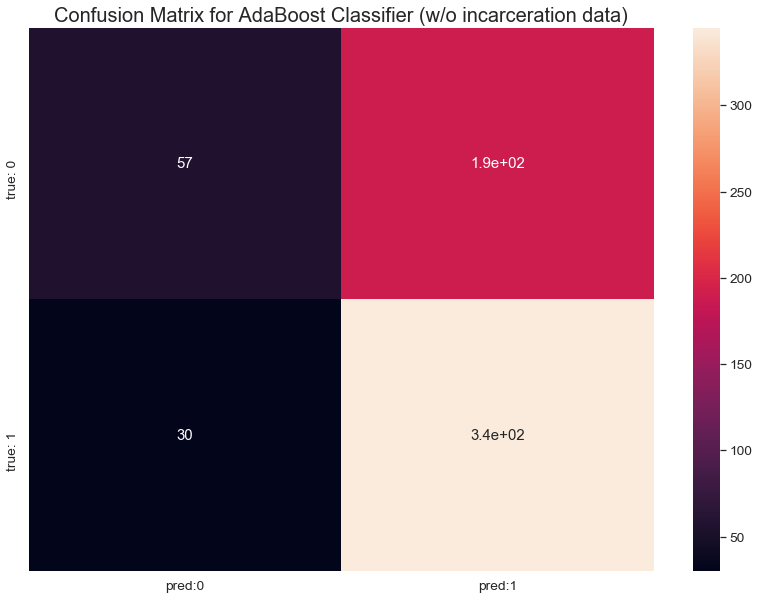

In [190]:
# Predict on test set
ab2_gs_pred = ab2_gs.predict(X2_test)

# Generate metrics for model performance
ab2_gs_f1_score = f1_score(y2_test, ab2_gs_pred)
print("AdaBoost Classifier: F1 score on Test Set: {}".format(ab2_gs_f1_score))
print("--------------------------------------------------")
print(classification_report(y2_test, ab2_gs_pred))

# Build Confusion Matrix
unique_label = np.unique([y2_test, ab2_gs_pred])

#ax = plt.subplot()
cmtx = pd.DataFrame(confusion_matrix(y2_test, ab2_gs_pred, labels=unique_label), 
                   index=['true: {:}'.format(x) for x in unique_label], 
                   columns=['pred:{:}'.format(x) for x in unique_label]);
sns.set(font_scale=1.25)
sns.heatmap(cmtx, annot=True);
#sns.heatmap(cmtx/np.sum(cmtx), annot=True, fmt='.2%');

plt.title("Confusion Matrix for AdaBoost Classifier (w/o incarceration data)", fontsize=20);

**Summary of *MODEL* step:** 
- Overview of Modeling Approach and Performance Metrics
- Implemented the following models and evaluated performance and confusion matrices:
    - Baseline Decision Tree Classifier
    - Random Forest Classifier
    - Extra Trees Classifier
    - AdaBoost Classifier
- Implemented the above models on both sets of data - with incarceration-related features and without.

## **Interpret**

**Planned tasks:**

1. Interpret results of the models.
2. Examine feature importance of best performing models.

### Models on data *with* incarceration-related features

In [193]:
# Decision Tree Classifier
print("\nBaseline Decision Tree Classifier Model Performance:")
print("Best Training F1 Score: {}".format(clf_bl_f1_tr))
print("F1 score on Test set: {}".format(clf_bl_f1))
print(classification_report(y_test, clf_bl_preds))
print("Top 10 Features and Feature Importance Scores:")
clf_bl_feat_import[:10]
print("--------------------------")

# Random Forest Classifier
print("\nRandom Forest Classifier Model Performance")
print("Best Training F1 Score: {}".format(rf_gs.best_score_))
print("Best Params: {}".format(rf_gs.best_params_))
print("F1 score on Test set: {}".format(rf_gs_f1))
print(classification_report(y_test, rf_gs_pred))
print("Top 10 Features and Feature Importance Scores:")
rf_feat_import[:10]
print("--------------------------")

# Extra Trees Classifier
print("\nExtra Trees Classifier Model Performance")
print("Best Training F1 Score: {}".format(et_gs.best_score_))
print("Best Params: {}".format(et_gs.best_params_))
print("F1 score on Test set: {}".format(et_gs_f1_score))
print(classification_report(y_test, et_gs_pred))
print("--------------------------")

# AdaBoost Classifier
print("\nAdaBoost Classifier Model Performance")
print("Best Training F1 Score: {}".format(ab_gs.best_score_))
print("Best Params: {}".format(ab_gs.best_params_))
print("F1 score on Test set: {}".format(ab_gs_f1_score))
print(classification_report(y_test, ab_gs_pred))
print("--------------------------")



Baseline Decision Tree Classifier Model Performance:
Best Training F1 Score: 0.7856866761145831
F1 score on Test set: 0.7824933687002652
              precision    recall  f1-score   support

           0       0.67      0.66      0.66       246
           1       0.78      0.79      0.78       375

    accuracy                           0.74       621
   macro avg       0.72      0.72      0.72       621
weighted avg       0.74      0.74      0.74       621

Top 10 Features and Feature Importance Scores:


[(0.1281, 'total_jail_pop_rate_2016'),
 (0.1071, 'total_jail_pop_rate_2008'),
 (0.0564, 'total_jail_pop_2010'),
 (0.0518, 'total_jail_from_other_fed_2008'),
 (0.039, 'total_jail_pop_rate_2015'),
 (0.0369, 'PopChangeRate1018'),
 (0.0345, 'total_jail_pop_rate_2009'),
 (0.0265, 'total_jail_pop_rate_2010'),
 (0.0248, 'total_jail_from_other_jail_2013'),
 (0.0228, 'male_jail_pop_rate_2009')]

--------------------------

Random Forest Classifier Model Performance
Best Training F1 Score: 0.8204492290448034
Best Params: {'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 1000}
F1 score on Test set: 0.8104265402843602
              precision    recall  f1-score   support

           0       0.78      0.48      0.60       246
           1       0.73      0.91      0.81       375

    accuracy                           0.74       621
   macro avg       0.76      0.70      0.70       621
weighted avg       0.75      0.74      0.73       621

Top 10 Features and Feature Importance Scores:


[(0.0114, 'total_jail_pop_rate_2016'),
 (0.0093, 'total_jail_pop_rate_2015'),
 (0.0081, 'total_jail_pop_rate_2008'),
 (0.0076, 'total_jail_pop_rate_2014'),
 (0.0061, 'PopChangeRate1018'),
 (0.006, 'total_jail_pop_rate_2009'),
 (0.006, 'male_jail_pop_rate_2008'),
 (0.0059, 'total_jail_pop_rate_2013'),
 (0.0058, 'PopChangeRate1718'),
 (0.0054, 'white_jail_pop_rate_2017')]

--------------------------

Extra Trees Classifier Model Performance
Best Training F1 Score: 0.805365195201697
Best Params: {'et__criterion': 'entropy', 'et__max_depth': None, 'et__min_samples_leaf': 3, 'et__min_samples_split': 5, 'et__n_estimators': 1000}
F1 score on Test set: 0.7914317925591883
              precision    recall  f1-score   support

           0       0.78      0.35      0.48       246
           1       0.69      0.94      0.79       375

    accuracy                           0.70       621
   macro avg       0.73      0.64      0.64       621
weighted avg       0.72      0.70      0.67       621

--------------------------

AdaBoost Classifier Model Performance
Best Training F1 Score: 0.8640673398498868
Best Params: {'ab__learning_rate': 0.1, 'ab__n_estimators': 1000}
F1 score on Test set: 0.8655569782330346
              precision    recall  f1-score   support

           0       0.83      0.72      0.77       246
           1       0.83      0.90      0.87       

Our Baseline model performance achieved an F1 score of 78%.

**Best performing model based on F1 Score:** AdaBoost Classifier
- AdaBoost achieved an F1 score of 86.4% on the training data and 86.6% on the test data. Precision was 83% for each label, but recall had some differentiation.  Recall for predicting counties with decreased/steady rates was always lower compared to recall for counties with increased rates (72% and 90%).
- Feature importance across these models shows that previous years' incarceration rates were among the most important, along with population change rates for 2010 to 2018 and from 2017 to 2018.
    

### Models on data *without* incarceration-related features

In [204]:
# Decision Tree Classifier
print("\nBaseline Decision Tree Classifier Model Performance:")
print("Best Training F1 Score: {}".format(clf_bl2_f1_tr))
print("F1 score on Test set: {}".format(clf_bl2_preds_f1_score))
print(classification_report(y2_test, clf_bl2_preds))
print("Top 10 Features and Feature Importance Scores:")
clf_bl2_feat_import[:10]
print("--------------------------")

# Random Forest Classifier
print("\nRandom Forest Classifier Model Performance")
print("Best Training F1 Score: {}".format(rf2_gs.best_score_))
print("Best Params: {}".format(rf2_gs.best_params_))
print("F1 score on Test set: {}".format(rf2_gs_f1))
print(classification_report(y2_test, rf2_gs_pred))
print("Top 10 Features and Feature Importance Scores:")
rf2_feat_import[:10]
print("--------------------------")

# Extra Trees Classifier
print("\nExtra Trees Classifier Model Performance")
print("Best Training F1 Score: {}".format(et2_gs.best_score_))
print("Best Params: {}".format(et2_gs.best_params_))
print("F1 score on Test set: {}".format(et2_gs_f1_score))
print(classification_report(y2_test, et2_gs_pred))
print("--------------------------")

# AdaBoost Classifier
print("\nAdaBoost Classifier Model Performance")
print("Best Training F1 Score: {}".format(ab2_gs.best_score_))
print("Best Params: {}".format(ab2_gs.best_params_))
print("F1 score on Test set: {}".format(ab2_gs_f1_score))
print(classification_report(y2_test, ab2_gs_pred))
print("--------------------------")


Baseline Decision Tree Classifier Model Performance:
Best Training F1 Score: 0.6481692946796995
F1 score on Test set: 0.5545454545454545
              precision    recall  f1-score   support

           0       0.43      0.59      0.49       246
           1       0.64      0.49      0.55       375

    accuracy                           0.53       621
   macro avg       0.54      0.54      0.52       621
weighted avg       0.56      0.53      0.53       621

Top 10 Features and Feature Importance Scores:


[(0.0655, 'PopChangeRate1018'),
 (0.0308, 'NonEnglishHHPct'),
 (0.0287, 'MedianNonVetsInc'),
 (0.0265, 'PctNonVetsDisabilty'),
 (0.0241, 'FemaleHHPct'),
 (0.0239, 'PopChangeRate1718'),
 (0.0184, 'LessThanHSVetsPct'),
 (0.018, 'GulfWar1VetsPct'),
 (0.0176, 'MedHHInc'),
 (0.0171, 'PctEmpTrade')]

--------------------------

Random Forest Classifier Model Performance
Best Training F1 Score: 0.7655763162602993
Best Params: {'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 1000}
F1 score on Test set: 0.7580645161290321
              precision    recall  f1-score   support

           0       0.64      0.33      0.44       246
           1       0.67      0.88      0.76       375

    accuracy                           0.66       621
   macro avg       0.65      0.61      0.60       621
weighted avg       0.66      0.66      0.63       621

Top 10 Features and Feature Importance Scores:


[(0.0105, 'PctNonVetsDisabilty'),
 (0.0099, 'PopChangeRate1018'),
 (0.0096, 'PopChangeRate1718'),
 (0.0076, 'NaturalChangeRate0010'),
 (0.0074, 'NaturalChangeRate1018'),
 (0.0068, 'MedHHInc'),
 (0.0065, 'Age65AndOlderPct2010'),
 (0.0064, 'PctEmpChange1718'),
 (0.0064, 'NaturalChange1018'),
 (0.0063, 'PctEmpChange0718')]

--------------------------

Extra Trees Classifier Model Performance
Best Training F1 Score: 0.7744856049502465
Best Params: {'et2__criterion': 'entropy', 'et2__max_depth': 10, 'et2__min_samples_leaf': 3, 'et2__min_samples_split': 10, 'et2__n_estimators': 1000}
F1 score on Test set: 0.7576419213973798
              precision    recall  f1-score   support

           0       0.65      0.21      0.32       246
           1       0.64      0.93      0.76       375

    accuracy                           0.64       621
   macro avg       0.65      0.57      0.54       621
weighted avg       0.64      0.64      0.58       621

--------------------------

AdaBoost Classifier Model Performance
Best Training F1 Score: 0.7685765637838845
Best Params: {'ab2__learning_rate': 0.1, 'ab2__n_estimators': 100}
F1 score on Test set: 0.7590759075907592
              precision    recall  f1-score   support

           0       0.66      0.23      0.34       246
           1       0.65      0.92      0.76 

The Baseline model achieved an F1 score of 55.45%, with a training F1 score of 64.8% suggesting our model was overfitting to the training data.

**Best Performing Model based on F1 Score:** AdaBoost Classifier, but...
- Our AdaBoost model achieved an F1 score of 75.9%, only slightly better than the Extra Trees and Random Forest F1 scores (both achieved 75.8%). 
- However, the AdaBoost model performed poorly when it came to predicting counties with decreased/steady rates, with a recall score of just 23% and an F1 score of 34% for this class label (0, Same or Decrease). By comparison, the Decision Tree Classifier and Random Forest both had higher recall scores on this class label (59% and 33% respectively), although precision scores for the Decision Tree were quite poor.
- The Random Forest Classifier had almost as high in terms of the overall F1 score, and it had a higher F1 score on predicting class label 0 (Same or Decrease) at 44%.  
- *Given this, Random Forest is our preferred model, showing an overall improvement to the F1 scroe of almost 21% from the baseline Decision Tree Classifier.*
- The top features in the RF model are Percentage of Non-Veterans who are on Disability, population change rates, natural change rates (2000-2010, and 2010-2018), median household income, percentage of the population aged 65 or older in 2010, and percentage employment change 2017-2018.

# Conclusion

## Summary of Findings

- In general, the models struggled with accurately classifying counties with decreased/steady rates, resulting in consistently lower f1 scores for this class label. 
- If we include incarceration-related features, we can see an improvement in the overall F1 scores of 87%, which is a little over a 10% increase from our best performing model on the data *without* the incarceration-related features. 
    - However, including incarceration-related features unsurprisingly means that these same features will have the most predictive power, thereby mitigating the overall understanding of how other population and socio-economic conditions interact with jail incarceration rate changes.
- Looking at the model on data *without* incarceration-related features, we can see that county-level data on disability, population change rates and natural change rates, household income, the proportion of elderly in the population, and percentage change in employment are among the top 10 important features in our best performing model.
    - The best performing model on data without incarceration-related features is the Random Forest Classifier.

## Considerations for Future Analysis

- Classification models on top n features to see if model performance improves and if limited features could be used for continuous monitoring and predicting.
- Feature engineering to improve model performance and possibly reduce the number of total features.
- Incorporate additional county-level data, including election data and political party distributions.
- Regression analysis to predict the actual rates per county.